# Title: Building Accurate Models for Unit Sales Prediction in Favorita Stores using Time Series Forecasting

# Project Description

A time series is a sequence of data points that are indexed and ordered chronologically over time. Time series data can be observed at regular or irregular intervals and can be collected over any time period, ranging from seconds to decades or even centuries. Time series data can be univariate (i.e., a single variable is recorded over time) or multivariate (i.e., multiple variables are recorded over time).Favorita Corporation is an Ecuadorian company that creates and invests in the commercial, industrial and real estate areas. Its subsidiaries have activities in six countries in the region, including Panama, Paraguay, Peru, Colombia, Costa Rica and Chile. They offer the best products, services and experiences in an efficient, sustainable and responsible way to improve the quality of life. 

The aim of this project is to forecast the unit sales of the products across different stores. This is to optimize their inventory management , marketing strategies  and pricing  decisions. To achieve this results, we employed the use of time series in collaboration with different machine learning algorithms via the CRISP-DM framework. 

The objective of this analysis is to select the best prediction model from the different ML algorithms tested. This model will be the solution to be adopted by the company to help Favorita Corporation make insightful decisions in relation to their retail sales ,promotion and customer statisfaction. 

# Hypothesis 

- Null Hypothesis:

Promotional activities does not have a significant impact on the store sales at Corporation Favorita.


- Alternate Hypothesis:

Promotional activities have a significant impact on the store sales at Corporation Favorita.


# Questions 

1.Which city had the highest stores

2.Which month did we have the highest sale

3.Which store had the highest transaction?

4.Which store had the highest sale?

5.What is the most bought product?

6.Did Earthquake Have an Effect on Sales?



# Libraries Installation

In [1]:
##for autoarima 

##!pip install pmdarima

##For Facebook Prophet
##!pip install fbprophet
##!pip install category_encoders

# Libraries Importation

In [1]:
##data handling

import pandas as pd
import numpy as np

pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 100)

##data visualizations

import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as ex
import plotly.offline as po
from prophet.plot import plot_plotly, plot_components_plotly 

##Algorithms 
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from prophet import Prophet
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor

###feature processors 

from sklearn.preprocessing import LabelEncoder
from category_encoders.binary import BinaryEncoder
from sklearn.preprocessing import OrdinalEncoder

##Error evaluations

from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_log_error as MSLE
from sklearn.metrics import mean_squared_error as MSE
from statsmodels.tools.eval_measures import rmse

##stat models 
from statsmodels.tsa.stattools import adfuller as adf ##for adf test
import statsmodels.api as sma ### for seasonal decomposition 
from statsmodels.graphics.tsaplots import plot_acf as ACF
from statsmodels.graphics.tsaplots import plot_pacf as PACF
from statsmodels.tsa.stattools import grangercausalitytests ##grenger causality test
 
# Other packages
import os
import warnings 
warnings.filterwarnings("ignore")
from datetime import datetime
import logging
logging.getLogger('prophet').setLevel(logging.WARNING)
import joblib

c:\Users\Gregory Arthur\Desktop\python projects\Streamlit App\stenv\lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



ModuleNotFoundError: No module named 'pmdarima'

### This Project, we will do the following:
    
    - Perform Univariate Time Series using Facebook Prophet, and ARIMA
    - Perform multivariate using Facebook Prophet, ARIMA, Random Forest, Decision Tree

Below is the section to import all the packages/libraries that will be used through this notebook.

# 1 Data loading


In [3]:
##Creating a function to parse our date

def convert_to_date(w):
    return datetime.strptime(w,"%Y-%m-%d")

#Declaring data file path variables
train_path = "Desktop/Pandas/Azubi/LP2/train.csv"
test_path = "Desktop/Pandas/Azubi/LP2/test.csv"

store_path = "Desktop/Pandas/Azubi/LP2/stores.csv"
holidays_path = "Desktop/Pandas/Azubi/LP2/holidays_events.csv"
transactions_path = "Desktop/Pandas/Azubi/LP2/transactions.csv"
oil_path = "Desktop/Pandas/Azubi/LP2/oil.csv"


#Reading the data with pandas
df_train = pd.read_csv(train_path, parse_dates= ["date"], date_parser= convert_to_date)
df_test = pd.read_csv(test_path, parse_dates= ["date"], date_parser= convert_to_date)

store = pd.read_csv(store_path)
holidays = pd.read_csv(holidays_path, parse_dates= ["date"], date_parser= convert_to_date)
transactions = pd.read_csv(transactions_path, parse_dates= ["date"], date_parser= convert_to_date)
oil = pd.read_csv(oil_path, parse_dates= ["date"], date_parser= convert_to_date)

In [4]:
## we will just take a look at each dataset

df_train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [5]:
df_test

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9


In [6]:
store

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [7]:
oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [8]:
transactions

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [9]:
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


# 2 Exploratory Data Analysis

Approach:
    
 - We will explore each dataset individually 
 - We will answer each questions
 - We won't visualize the test data into details since its similar to our train data
 - A heavy focuse will be on the train dataset since that's the most crucial dataset for our predictions

## 2.1 Datasets Overview

### 2.1.1 Checking for Missing values and an Overview of the Dataset

##### Methodology: I will use a for loop to loop through each dataframe

In [10]:
##putting the dataframes in a list to make it easy to loop through
dataframes= [df_train, df_test, transactions, oil, holidays, store]

for df in dataframes:
    print(df.info(), "\n\n", df.isna().sum(), "\n\n")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float64       
 5   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 137.4+ MB
None 

 id             0
date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64 


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           28512 non-null  int64         
 1   date         28512 non-null  datetime64[ns]
 2   store_nbr    28512 non-null  int64         
 3   family       28512 non-null  object        
 4   onpromot

#### Notes from the .info()

- Every attribute of each dataset has the right datatype
- There were 43 missing values in the oil dataset

### 2.1.2 Exploring the store dataset

In [11]:
store.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4




We will explore each column to see if we can find some valuable information

Text(0.5, 1.0, 'Count of Clusters')

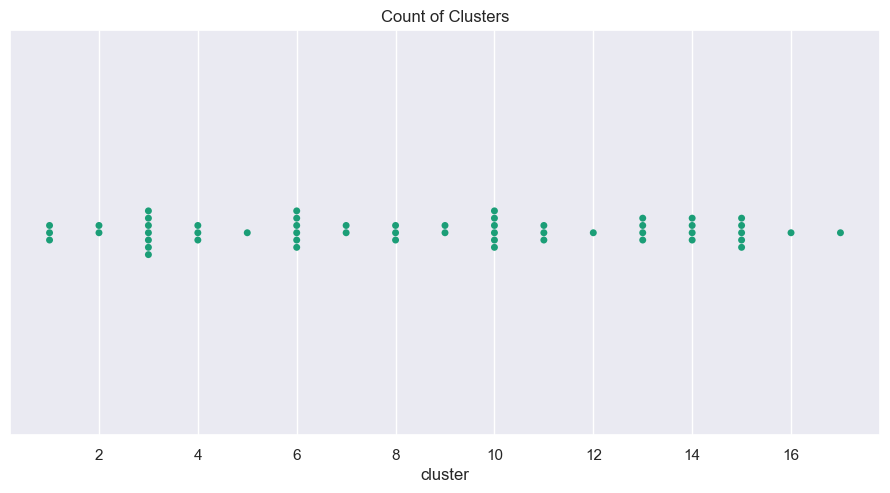

In [321]:
sns.set(rc={"figure.figsize": (10,5)})
sns.swarmplot(data=store, x="cluster", hue= "type", palette= "Dark2")
plt.title("Count of Clusters")
##There are 17 unique clusters with cluster 3 having the highest count

##There are 17 unique clusters with cluster 3 having the highest count

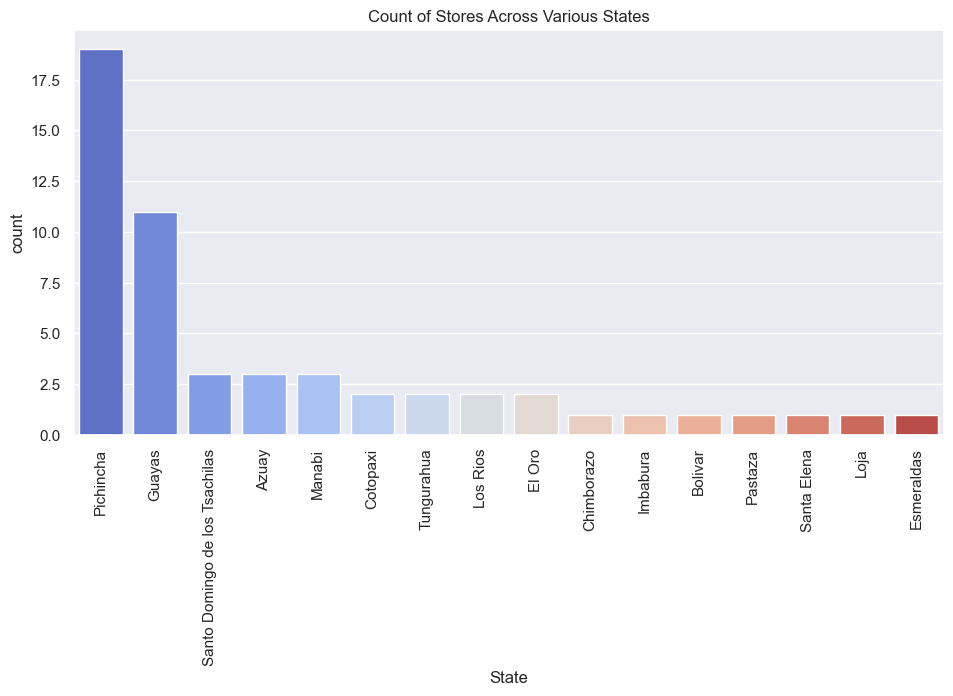

<Figure size 2000x1500 with 0 Axes>

In [320]:
## Checking to see the occurence of each store across Ecaudor
state_count= store.state.value_counts().reset_index()

state_count.columns= ["State", "count"]

sns.barplot("State", data=state_count, y= "count", palette= "coolwarm")

plt.title("Count of Stores Across Various States")
plt.xticks(rotation=90)
plt.figure(figsize= (20,15))

plt.show()
##There are 16 unique states with Pichincha having the highest number of stores

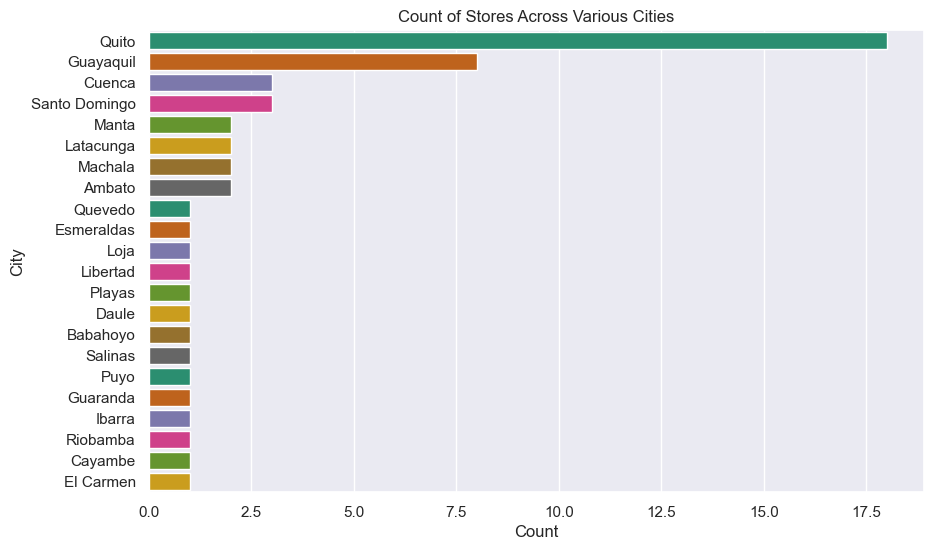

In [14]:
city_count = store.city.value_counts().reset_index()
city_count.columns = ["city", "count"]


plt.figure(figsize=(10, 6))
sns.barplot(data=city_count, y="city", x="count", palette="Dark2")
plt.title("Count of Stores Across Various Cities")
plt.xlabel("Count")
plt.ylabel("City")
plt.show()


##store.city.value_counts()
##There are 22 unique cities with Quito having the highest count

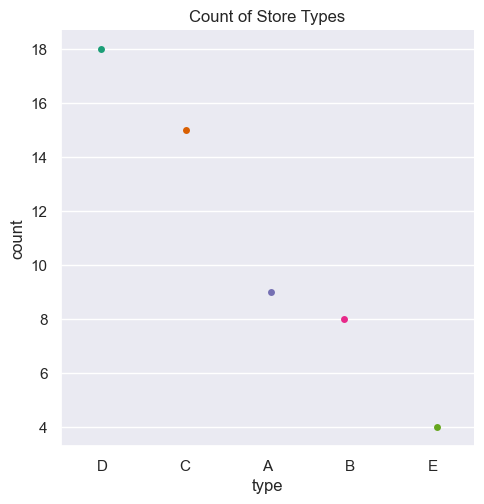

In [15]:
type_count= store.type.value_counts().reset_index()

type_count.columns= ["type", "count"]

sns.set(rc={"figure.figsize": (10,5)})
sns.catplot("type", data=type_count, y= "count", palette= "Dark2")

plt.title("Count of Store Types")


##store type D has the highest count

plt.show()

In [16]:
print("There are:", len(store.store_nbr.unique()), "Unique Stores")
##There are 54 unique stores

There are: 54 Unique Stores


In [17]:
store.describe()

,store_nbr,cluster
count,54.000000,54.000000
mean,27.500000,8.481481
std,15.732133,4.693395
min,1.000000,1.000000
25%,14.250000,4.000000
50%,27.500000,8.500000
75%,40.750000,13.000000
max,54.000000,17.000000


In Summary:

    - There are 17 unique clusters with cluster 3 having the highest count
    - There are 16 unique states
    - There are 22 unique cities with Quito having the highest count
    - There are 54 unique stores Across 16 states and 22 cities
    - There are 5 unique store types with stores type D having the highest count

### 2.1.3 Exploring the Transaction Dataset

In [18]:
transactions

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [19]:
##making a copy just in case we make any mistake 

## Also, we will be using the copy for our exploration


trans= transactions.copy()

In [20]:
##Setting the data as our index for better analysis 

trans= trans.set_index("date")

In [21]:
trans

,store_nbr,transactions
date,,
2013-01-01,25,770
2013-01-02,1,2111
2013-01-02,2,2358
2013-01-02,3,3487
2013-01-02,4,1922
...,...,...
2017-08-15,50,2804
2017-08-15,51,1573
2017-08-15,52,2255


### 2.1.3(a) plotting our transaction time series for insights


In [22]:
##plotting our transaction time series to see its behaviour

fig= ex.line(x= trans.index, y= "transactions", data_frame= trans)

fig.update_xaxes(rangeslider_visible= True)

fig.show()

#### Notes After Overview:

- We can see some spikes in transactions at the begining of each year. We might want to resample for further investigations

### 2.1.3(b) Checking for outliers


<Axes: >

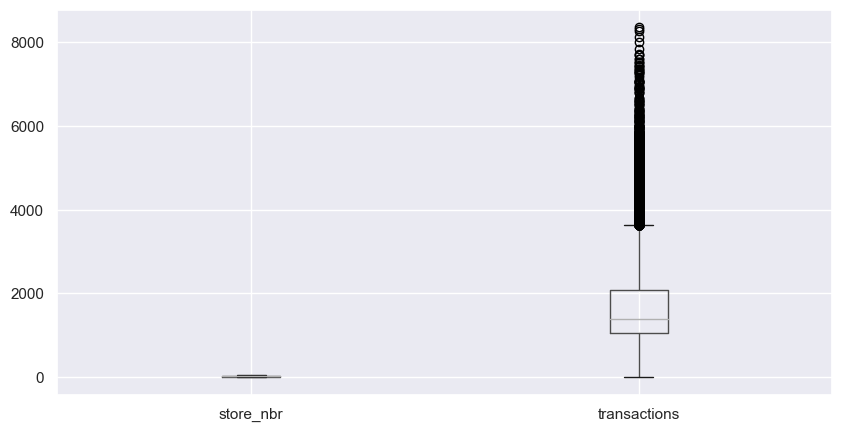

In [23]:
##Let's check for outliers

transactions.boxplot()

#### Notes after Checking for outliers:

- There are outliers therefore, when plotting our resampled values, we might want to use median values for our analysis instead of the mean.




### 2.1.3(c) Resampling the Transaction Data

In [331]:
monthly_trans= trans.drop(labels= "store_nbr",axis= 1).resample("M").median()
monthly_trans

,transactions
date,
2013-01-31,1386.0
2013-02-28,1403.5
2013-03-31,1424.0
2013-04-30,1423.5
2013-05-31,1424.0
2013-06-30,1426.0
2013-07-31,1419.0
2013-08-31,1391.0
2013-09-30,1374.5


Text(0.5, 1.0, ' Monthly Average Transactions')

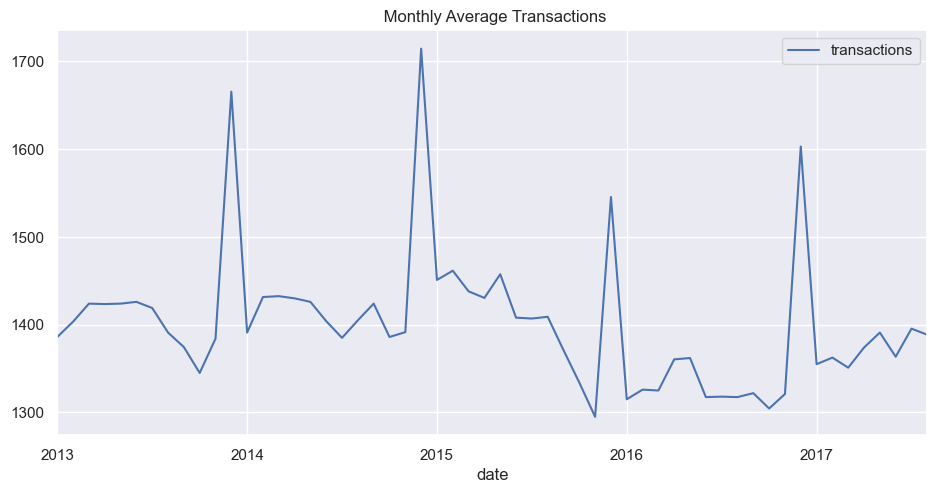

In [337]:
monthly_trans.plot()
plt.title(" Monthly Average Transactions")



In [26]:


fig2= ex.line(data_frame= monthly_trans, x=monthly_trans.index, y= "transactions", title= "Monthly Median Transactions")
fig2.update_xaxes(rangeslider_visible= True)

fig2.show()

### Notes:
- We can see some seasonality in the transaction dataset, with a spike in transactions on 31st of December each year
- There was a relatively low drop in transactions in 2016
- There is also a minute spike on the 31st of May of each year

Text(0.5, 1.0, 'Top 5 Store with the Highest Transactions')

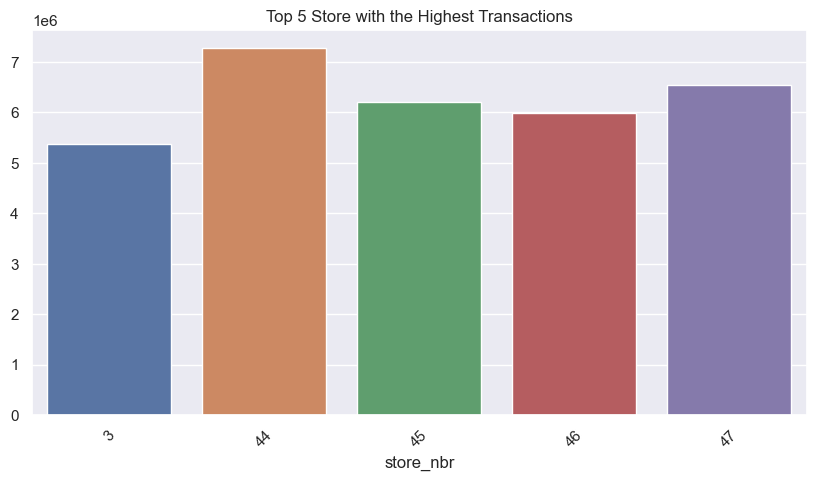

In [27]:
##let's see which stores had the highest transactions

sto_tran= trans.groupby("store_nbr")["transactions"].agg("sum").sort_values(ascending= False).head()

sns.barplot(x=sto_tran.index, y=sto_tran.values)

plt.xticks(rotation= 45)
plt.title('Top 5 Store with the Highest Transactions')

### 2.1.3 (d) Bivariate on transaction

#### Earthquake Effect on Transactions

- I just want to see how earthquake affected transactions. From a quick Google search, the earthquake happened in the city of Quito. Therefore I will only focus on stores in that city

- This is because if we are to consider the whole of equador, we won't see any inherent effect since the transactions of other stores from different cities might overshadow that of the equake location

#### Methodology:

- I will join the city column of the store dataframe to the transaction dataset
- Filter the trans_month data to get only the 2016 date
- Filter the store data to get only stores in quito

In [28]:
##filtering through stores in only Quito since that's where the earthquake happened

quito= store[store["city"]== "Quito"]

##getting only transactions in 2016 since that was the year of the earthquake
trans_2016= trans.loc["2016"]

In [29]:
quito

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15
16,17,Quito,Pichincha,C,12


In [30]:
trans_2016

,store_nbr,transactions
date,,
2016-01-02,2,6
2016-01-02,16,373
2016-01-02,20,1816
2016-01-02,21,1388
2016-01-02,22,849
...,...,...
2016-12-31,49,4051
2016-12-31,50,3388
2016-12-31,51,2742


In [31]:
##the inner join will get rid of any row in the trans dataframe which doesn't have a store number in quito

quake_trans= trans_2016.join(other=quito["city"], on= "store_nbr", how= "inner")
quake_trans

,store_nbr,transactions,city
date,,,
2016-01-02,2,6,Quito
2016-01-05,2,1903,Quito
2016-01-06,2,2058,Quito
2016-01-07,2,1821,Quito
2016-01-08,2,1887,Quito
...,...,...,...
2016-12-27,19,1366,Quito
2016-12-28,19,1382,Quito
2016-12-29,19,1352,Quito


In [32]:
##we are going to resample the quake data again to help
##we will be using the mean here because I am assuming that the earthquake could cause some unusual transactions (outliers)
##also, I will be just looking at the dates in April to see 

quake_2016=quake_trans.loc["2016-04-01": "2016-04-30"].resample("D").mean()

In [347]:
##quake_2016.drop("store_nbr", axis= 1).plot()
##plt.title("Transactions for April")

fig_quito= ex.line(data_frame= quake_2016, x= quake_2016.index, y= "transactions")


fig_quito.update_xaxes(rangeslider_visible=True)
fig_quito.show()


### Notes:

- There was no inherent effect of the earth quake on transactions. This could be also that we looked at all the stores in Quito as opposed to Muisne, which is the location of the earthquake

### Summary of Transaction Dataset:
    
    - The store dataset had some seasonality with a spike in sales on every 23rd of December
    - store number 44 had the highest number of transactions
    - There are some outliers in the transactions
    - No inherent difference in transactions after earthquake

### 2.1.4 Exploring the Holidays Dataset

In [34]:
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


In [35]:
##making a copy again to ensure we do not mistakenly lose data
holi= holidays.copy()

In [36]:
##Let's use a bubble plot to visualize the most prominent 

##We are trying to group the holidays based on count. And we are creating a column known as count. 

type_counts = holi.groupby('type').size().reset_index(name="count")



type_counts


,type,count
0,Additional,51
1,Bridge,5
2,Event,56
3,Holiday,221
4,Transfer,12
5,Work Day,5


In [37]:
##Now let's plot the dataframe above

fig = ex.scatter(type_counts, x='type', y='count', size='count', color= "type", hover_name='type',
                 log_y=False, size_max=60)


fig.show()

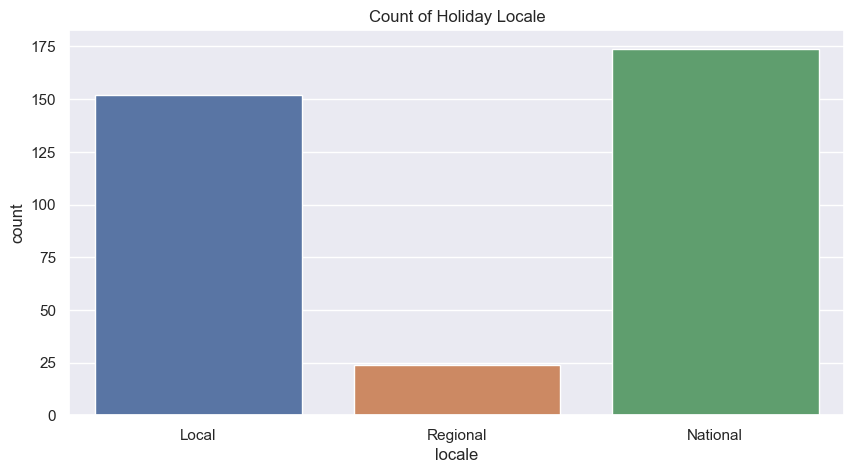

In [38]:
##Let's see which locale has the highest number of holidays

plt.title("Count of Holiday Locale")
sns.countplot("locale", data= holi)
plt.show()

In [39]:
##Let's also see how many holidays were transferred and not transfeered 

trans_count= holi.groupby("transferred").size().reset_index(name="count")

trans_count

,transferred,count
0,False,338
1,True,12


([<matplotlib.patches.Wedge at 0x21a4e52eb20>,
 [Text(-1.0936251618386073, 0.11825398679740307, 'False'),
  Text(1.0936251576867049, -0.11825402519461974, 'True')])

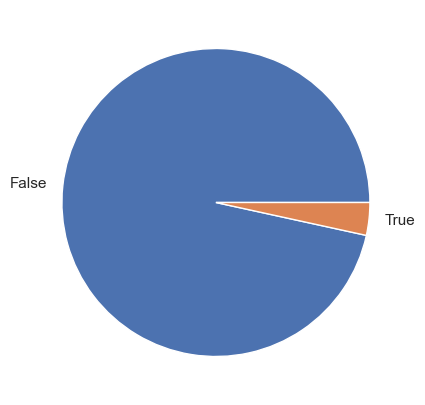

In [40]:
##visualizing the plot above 

sns.set_color_codes("pastel")

plt.pie(data= trans_count,x= "count", labels= "transferred" )

#### Summary of the Holiday Column:

- Most holidays were national holidays
- Most holidays were observed the same day they occured
- Most of the holidays were not transferred except 12 holidays

### 2.1.5 Exploring the Oil Dataset

In [41]:
oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [42]:
oil_1= oil.copy()

In [43]:
oil= oil.set_index("date")

In [44]:
oil

,dcoilwtico
date,
2013-01-01,NaN
2013-01-02,93.14
2013-01-03,92.97
2013-01-04,93.12
2013-01-07,93.20
...,...
2017-08-25,47.65
2017-08-28,46.40
2017-08-29,46.46


In [45]:
##We know this dataset has missing values, and since the first value is missing, I will use the backfill method 

oil["dcoilwtico"]= oil["dcoilwtico"].fillna(method= "bfill")

oil

,dcoilwtico
date,
2013-01-01,93.14
2013-01-02,93.14
2013-01-03,92.97
2013-01-04,93.12
2013-01-07,93.20
...,...
2017-08-25,47.65
2017-08-28,46.40
2017-08-29,46.46


<Axes: xlabel='date'>

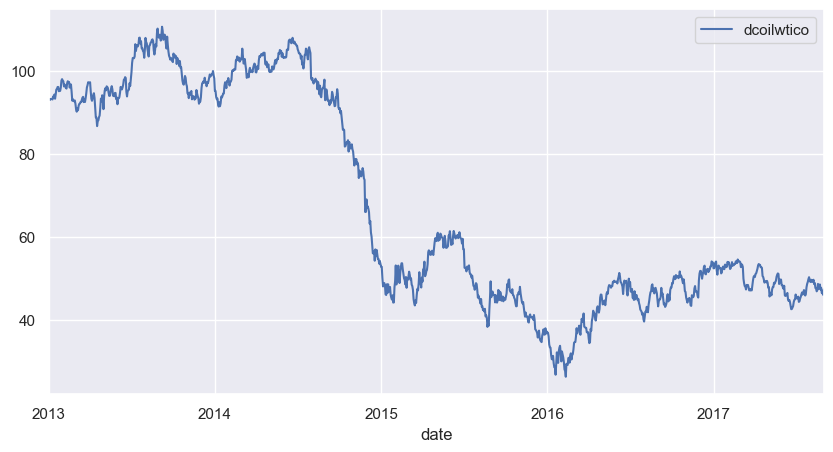

In [46]:
oil.plot()

#### Summary of the oil  dataset:

- There was a price drop from 2014 to 2017, we will see if it affected sales

### 2.1.6 Exploring the train dataset

In [47]:
## Creating a copy to ensure we can retrive the orginal dataframe incase of an error during our analysis

train_copy= df_train.copy()

In [48]:
train_copy=train_copy.set_index("date")

In [49]:
train_copy

,id,store_nbr,family,sales,onpromotion
date,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.000,0
2013-01-01,1,1,BABY CARE,0.000,0
2013-01-01,2,1,BEAUTY,0.000,0
2013-01-01,3,1,BEVERAGES,0.000,0
2013-01-01,4,1,BOOKS,0.000,0
...,...,...,...,...,...
2017-08-15,3000883,9,POULTRY,438.133,0
2017-08-15,3000884,9,PREPARED FOODS,154.553,1
2017-08-15,3000885,9,PRODUCE,2419.729,148


### 2.1.6(a) Univariate Analysis 

#### i. checking the distribution of the train dataset

array([[<Axes: title={'center': 'id'}>,
        <Axes: title={'center': 'store_nbr'}>],
       [<Axes: title={'center': 'sales'}>,
        <Axes: title={'center': 'onpromotion'}>]], dtype=object)

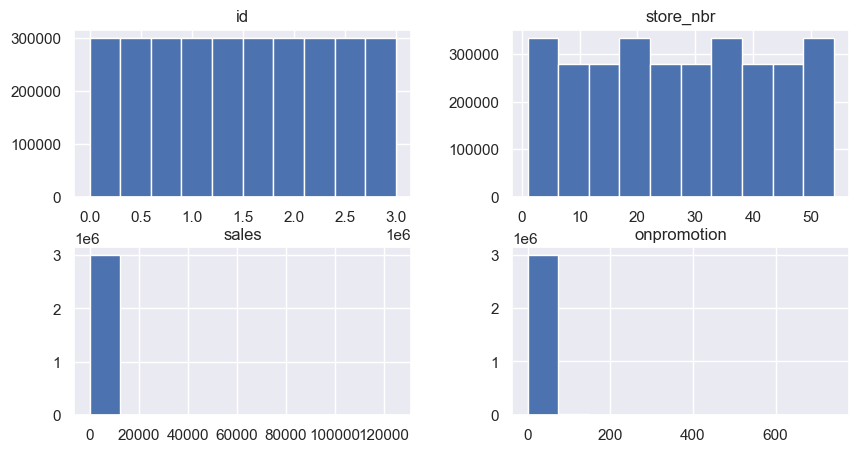

In [50]:
##Checking the distribution of the train dataset

train_copy.hist()

#### ii.Checking for Outliers

<Axes: >

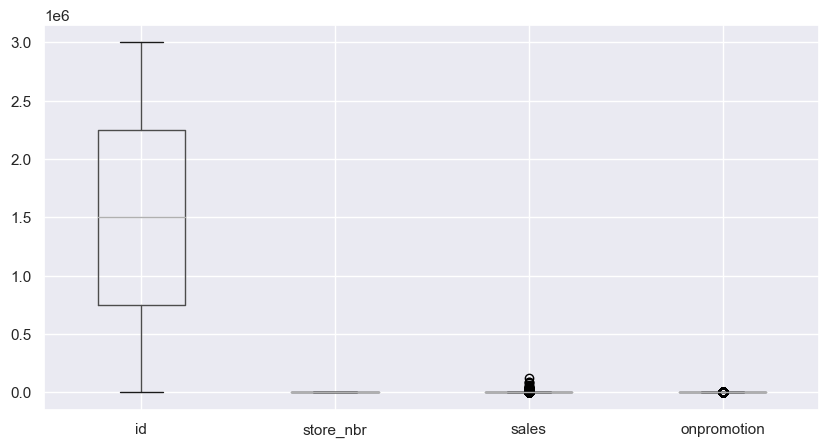

In [51]:

train_copy.boxplot()

#### Notes:

- There are some outliers in the sales colummn

#### iii. Exploring the family attrubute


In [52]:
## in this section, I want to see the products that were frequently bought

In [53]:

family_counts = train_copy.groupby('family').size().reset_index(name='count')


fig_1 = ex.scatter(family_counts, x='family', y='count', size='count', color= "family", hover_name='family',
                log_y=False, size_max=60)

fig_1.show()

All the family had the same count, and this makes sense because on days there were no purchases, the family of the product was still included in the dataset

In [54]:
#### Let's see which family was frequently bought  

family_bought= train_copy[train_copy["sales"]!=0 ]

##Lets group and plot

family_sale = family_bought.groupby('family').size().reset_index(name='count').sort_values(by= "count")


fig_2= ex.scatter(family_sale, x='family', y='count', size='count', color= "family", hover_name='family',
                log_y=False, size_max=60)

fig_2.show()

#### Notes on the Family Attibute

- books where bought less often, bread and bakery had the highest sales

#### iv. Exploring the on_promotion atttribute

<Axes: xlabel='date'>

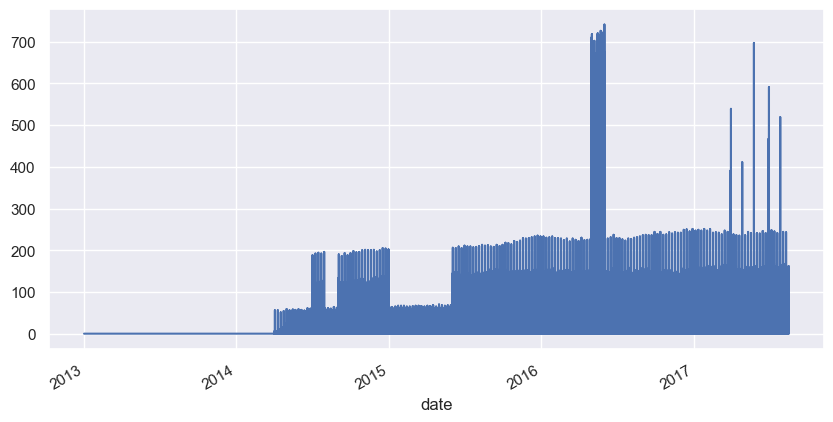

In [55]:
train_copy["onpromotion"].plot()

<Axes: xlabel='date'>

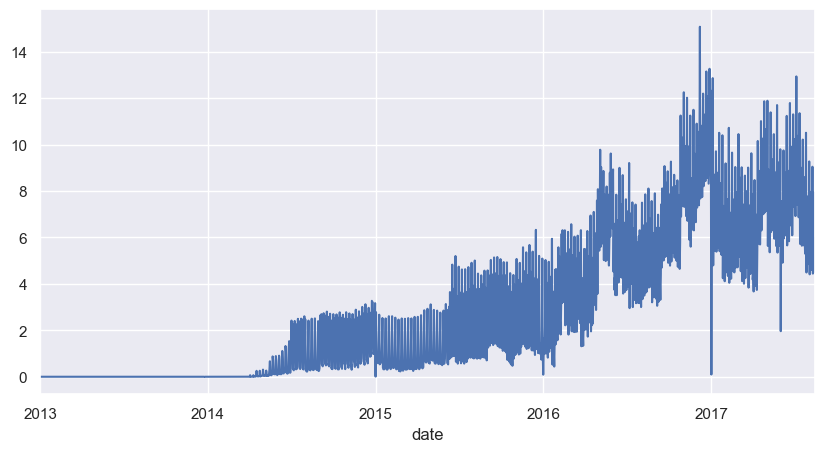

In [56]:
daily_promo=train_copy["onpromotion"].resample("D").mean()

daily_promo.plot()

- No promotions were made from 2013 to 2014
- There were increased promotions in 2016;likewise, 2017, and we will investigate that
- There was a drop in promotion at the begining of each year within from 2015 to 2016

In [57]:
##Let's see what happened each month
month_promo=train_copy[["onpromotion"]].resample("M").mean()


monthly_plot= ex.line(data_frame= month_promo, x= month_promo.index, y="onpromotion", title= "Average Monthly Promotions")
monthly_plot.show()

#### Notes of promotion after resmapling on promotion by month:
    
    - Promotions were toned down from January to May of 2015
    
    - There was a sharp increase in promotion from 30th April in 2016, and this is probably because of the earthquake. 
    
    - Also, we can see an increase in promotions for some days in march to july of 2017

#### Due to earthquake, might be interesting to see how promotions were affected in 2016


Text(0.5, 1.0, 'Monthly Promotions Average in 2016')

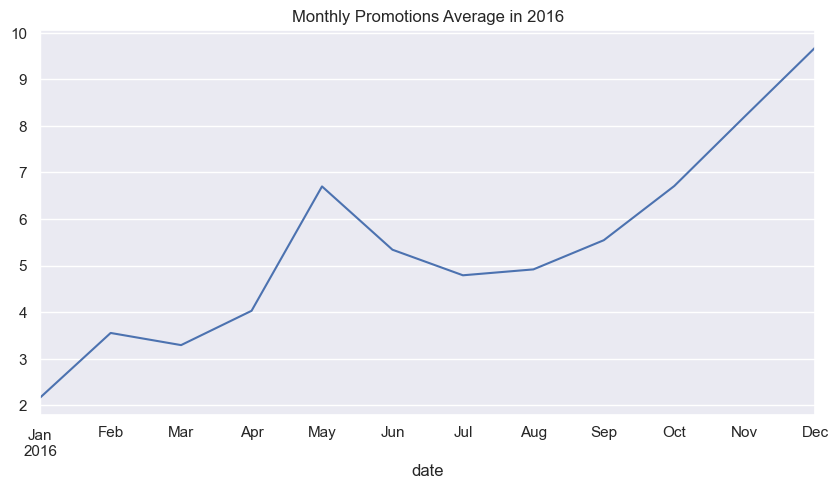

In [58]:
Month_2016=train_copy["onpromotion"].loc["2016"].resample("M").mean()

Month_2016.plot()
plt.title("Monthly Promotions Average in 2016")

#### Notes After Graph:

- From the graph, onpromotions in 2016 were pretty steady in April
- They increased promotion during the end of April and in May of 2016

#### Let's resample the above data by day to see which days  happened:


<Axes: xlabel='date'>

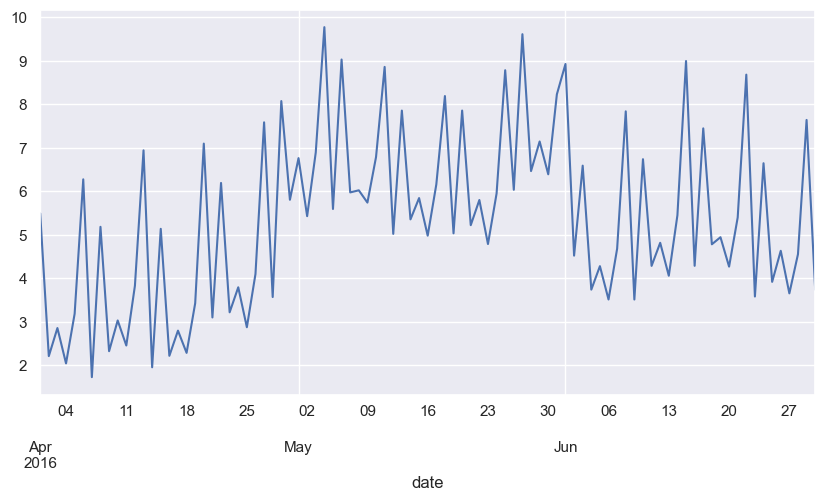

In [59]:

train_day=train_copy["onpromotion"].loc["2016-04":"2016-06"].resample("D").mean()

train_day.plot()

#### Notes After Graph
- Massive promotion was ran from 29th April to 31st May of 2016


#### v.Exploring the Sales Attribute

##### Overview of sales Attritbute

Text(0.5, 1.0, 'Sales with respect to Time')

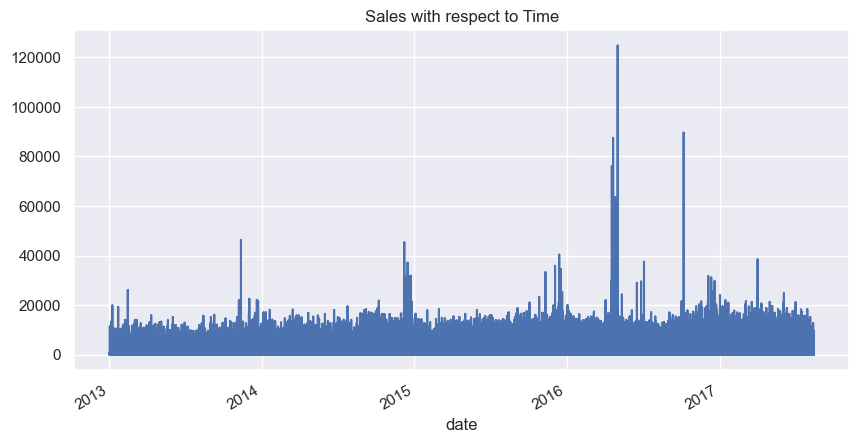

In [60]:
train_copy.sales.plot()
plt.title("Sales with respect to Time")

#### Note

- since the graph above seems to be all over, I will like to resample it day, week, month, and year to see how the sales changes overtime.




##### Resampled Daily Sales

<Axes: title={'center': 'Daily Average sales for Favorita'}, xlabel='date'>

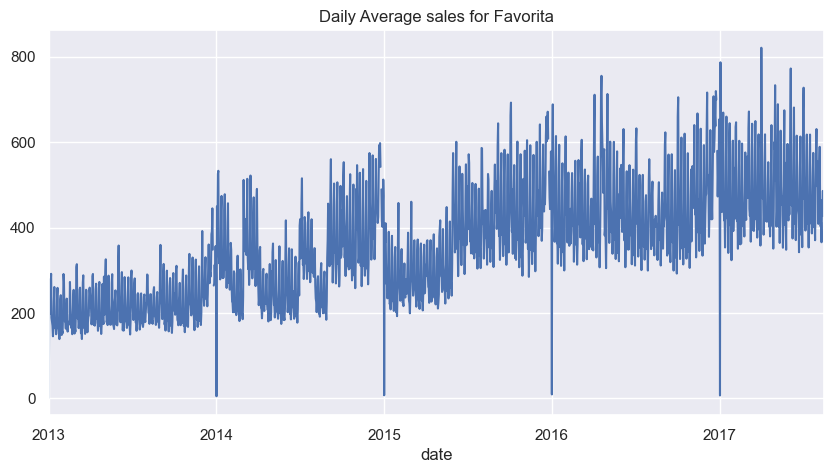

In [61]:

sale_daily=train_copy["sales"].resample("D").mean()

plt.title("Daily Average sales for Favorita")

sale_daily.plot()

#### Notes:

- There is a general upward trend 
- We can see a drop in sales at the beginning of each year 

##### Resampling Weekly sales

<Axes: title={'center': 'Weekly Average sales for Favorita'}, xlabel='date'>

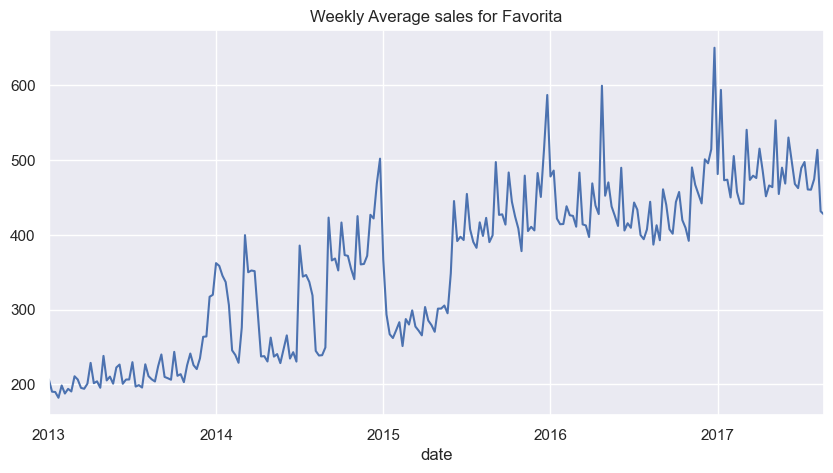

In [62]:
sale_weekly=train_copy["sales"].resample("W").mean()

plt.title("Weekly Average sales for Favorita")

sale_weekly.plot()

#### Notes:

- We can now see the trend in sales visibly

- We can see some heteroskedastic behavior (high variance)

#### Resampling Monthly Sales

<Axes: title={'center': 'Monthly Average sales for Favorita'}, xlabel='date'>

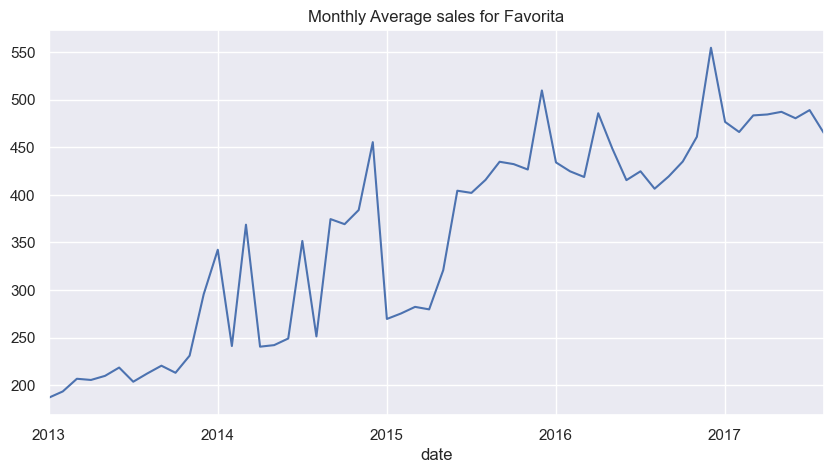

In [63]:
sale_monthly=train_copy["sales"].resample("M").mean()

plt.title("Monthly Average sales for Favorita")

sale_monthly.plot()

#### Notes:

- We can now see the trend in sales visibly

- We can see some heteroskedastic behavior (high variance)

### multivariate analysis

<Axes: >

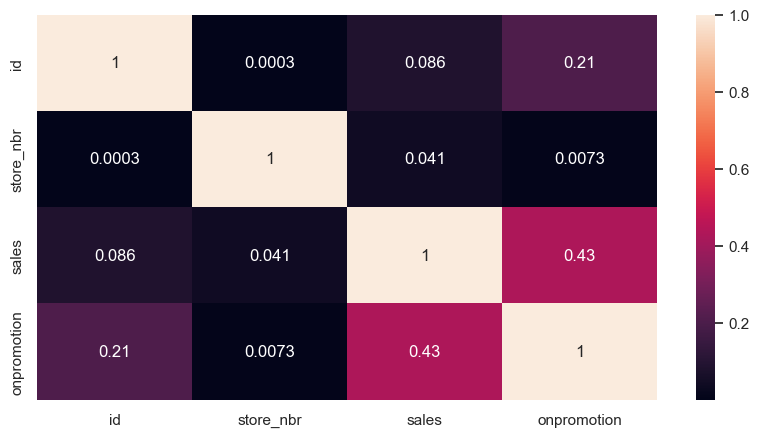

In [64]:
sns.heatmap(train_copy.corr(), annot= True)

## Answering Questions (Bivariate Analysis)


Q1.which city had the highest stores

Q2.which month did we have the highest sale

Q3.which store had the highest transaction?

Q4.which store had the highest sale?

Q5.what is the most bought product?

Q6.Did Earthquake have an effect on sales?

### Q1.which city had the highest stores


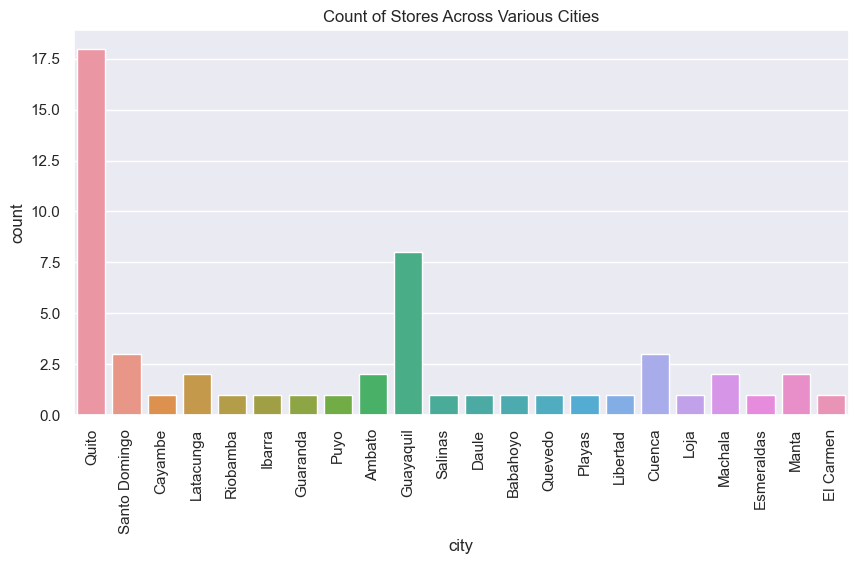

<Figure size 2000x1500 with 0 Axes>

In [65]:
sns.countplot("city", data=store)

plt.title("Count of Stores Across Various Cities")
plt.xticks(rotation=90)
plt.figure(figsize= (20,15))

plt.show()



Ans: From our analysis, we realized that Quilto had the highest number of sale


### Q2.which month did we have the highest sale


In [66]:
##to find this, we will group our unit sales by month across all the years

train_copy= df_train



In [67]:
train_copy["month"]= train_copy["date"].dt.month

In [68]:
train_copy

,id,date,store_nbr,family,sales,onpromotion,month
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1
1,1,2013-01-01,1,BABY CARE,0.000,0,1
2,2,2013-01-01,1,BEAUTY,0.000,0,1
3,3,2013-01-01,1,BEVERAGES,0.000,0,1
4,4,2013-01-01,1,BOOKS,0.000,0,1
...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,8
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,8
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,8
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,8


In [69]:
sales_by_month= train_copy.groupby("month").agg({"sales":"sum"}).sort_values(by="sales")



<Axes: xlabel='month', ylabel='sales'>

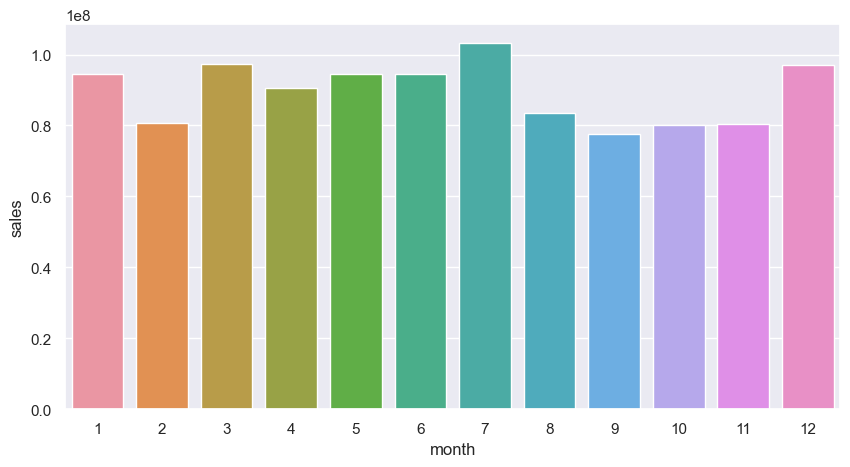

In [70]:
sns.barplot(data=sales_by_month, x= sales_by_month.index, y= "sales" )

- July recorded the highest Sale

### Q3.which store had the highest transaction?


Text(0.5, 1.0, 'Top 5 Store with the Highest Transactions')

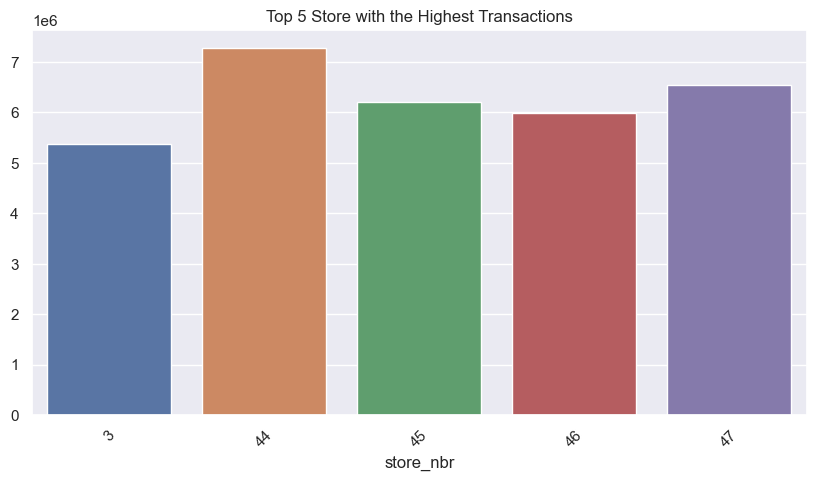

In [71]:
sto_tran= transactions.groupby("store_nbr")["transactions"].agg("sum").sort_values(ascending= False).head()

sns.barplot(x=sto_tran.index, y=sto_tran.values)

plt.xticks(rotation= 45)
plt.title('Top 5 Store with the Highest Transactions')

- Store 44 had the highest transaction

### Q4.which store had the highest sale?

Text(0.5, 1.0, 'Top 5 Store with the Highest Sale')

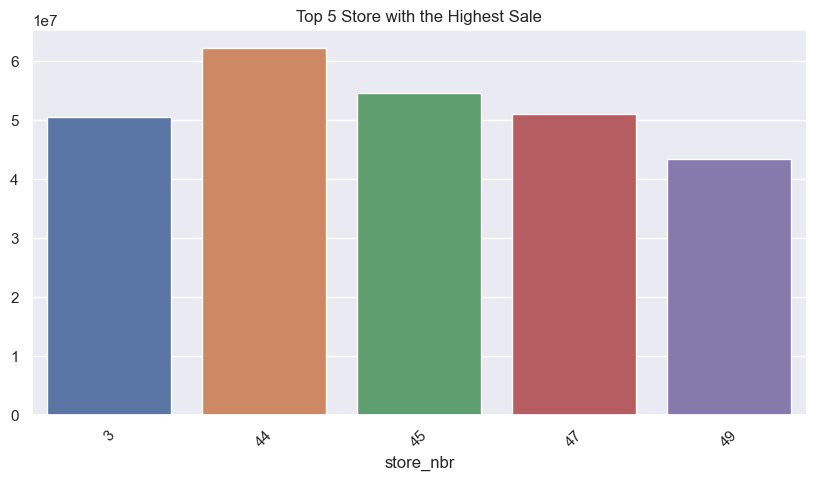

In [72]:
sto_sale= train_copy.groupby("store_nbr")["sales"].agg("sum").sort_values(ascending= False).head()

sns.barplot(x=sto_sale.index, y=sto_sale.values)


plt.xticks(rotation= 45)
plt.title('Top 5 Store with the Highest Sale')

- Store 44 had the highest number of unit sales. Also, it is worth noting that even though store 46 was part of the top 5 tstores with high transactions, it didn't make it to the list of stores with high number of unit sales 

### Q5.what is the most bought product per unit sale?

In [73]:
family_bought= train_copy[train_copy["sales"]!=0 ]

##Lets group and plot

family_sale = family_bought.groupby('family').size().reset_index(name='count').sort_values(by= "count")


fig_2= ex.scatter(family_sale, x='family', y='count', size='count', color= "family", hover_name='family',
                log_y=False, size_max=60)

fig_2.show()

#### Q6.Did Earthquake have an effect on Sales?

To find this, I will have to filter out stores only in Quito to help me better visualize the effect of sale

In [74]:
## I am going to load the dataframe for Quito since I already did the filtering earlier

quito

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15
16,17,Quito,Pichincha,C,12


In [75]:
quito_sales= train_copy.merge(right=quito, on= "store_nbr", how= "inner")

In [76]:
quito_sales.head(5)

,id,date,store_nbr,family,sales,onpromotion,month,city,state,type,cluster
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,1,Quito,Pichincha,D,13
1,1,2013-01-01,1,BABY CARE,0.0,0,1,Quito,Pichincha,D,13
2,2,2013-01-01,1,BEAUTY,0.0,0,1,Quito,Pichincha,D,13
3,3,2013-01-01,1,BEVERAGES,0.0,0,1,Quito,Pichincha,D,13
4,4,2013-01-01,1,BOOKS,0.0,0,1,Quito,Pichincha,D,13


In [77]:
### I am dropping the ID column

quito_sales.drop("id", axis= 1, inplace= True)

In [78]:
##setting my index
quito_sales=quito_sales.set_index("date")

In [79]:
### now, I am going to filter only sales from 2016 to  June 2016 to help me see what happened


quito_sales_2016= quito_sales.loc["2016-04": "2016-05"]

In [80]:
## dropping unecessary columns 

quito_sales_2016.drop(["store_nbr","onpromotion", "month","cluster"], axis= 1, inplace= True)

In [81]:
average_quito_sales= quito_sales_2016[["sales"]].resample("D").mean()

In [82]:
quito_daily_sales= ex.line(data_frame=average_quito_sales, x=average_quito_sales.index, y= average_quito_sales.sales,
        title= "Average Sales In Quito" )


quito_daily_sales.show()

#### Notes

There was no inherent effect of the earthquake on sales. This is becuase the earthquake happened in only Manabí province. Therefore the sales of other stores in Quito overshadowed the sales in Manabi.

source: https://www.worldvision.org/disaster-relief-news-stories/2016-ecuador-earthquake-facts

#  3. Modelling

In this section, we will be making our predictions. I will be taking three different processes:
    
    - Univariate modelling, where i try to predict sales using previous sales. I will be using models like ARIMA, and Facebook Prophet
    
    - Multivariate Modelling where I will look at how other features affect our target, and I will be using classical time series models such as SARIMAX and Facebook Prophet together with machine learning models such as Random Forest and decision Tree
    
    - Next I will try to predict actual sales of each store with ensemeble methods such as Gradient Boosting, XGBoost, Bagged Random Forest and Bagged Decision Tree
    
    
    - For each model, I will train my dataset on 90% of the data and then evaluate it on 10% and make a forecast on the test set

## 3.1 Univariate Modelling

The goal of this type of modelling is to forecast the general sales for Favorita irrespective of the product type, store number and other exogenous effects. Therefore, we will be using only time and the previous sales values to forecast the sales.

In [83]:
train_copy

,id,date,store_nbr,family,sales,onpromotion,month
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1
1,1,2013-01-01,1,BABY CARE,0.000,0,1
2,2,2013-01-01,1,BEAUTY,0.000,0,1
3,3,2013-01-01,1,BEVERAGES,0.000,0,1
4,4,2013-01-01,1,BOOKS,0.000,0,1
...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,8
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,8
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,8
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,8


In [84]:
"""
Let's go ahead and group our  copy train data by date to give us an idea of the total unit sales 
for each day from all stores and all 

"""
##creating a new dataframe to make the time the index

univar_sale= train_copy.drop(["id", "store_nbr", "family", "onpromotion", "month"], axis=1)

univar_sale= univar_sale.set_index("date")


In [85]:
###I am going to resample my dataframe by day

univar_sale= univar_sale.groupby(univar_sale.index).agg({"sales": sum})

<Axes: xlabel='date'>

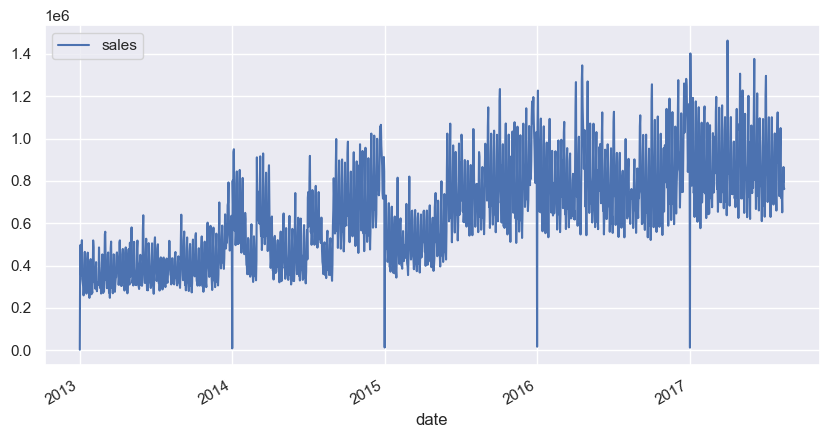

In [86]:
univar_sale.plot()

In [87]:
##Let's plot this to see the graph


fig_3= ex.line(univar_sale, x= univar_sale.index, y= "sales", title= "Aggregated Sales With Slider")
  
fig_3.update_xaxes(rangeslider_visible= True, 
                 rangeselector= dict(
                     
                     buttons= list([
                         
                         dict(count= 1, label= "1y", step= "year", stepmode= "backward"), 
                         dict(count= 2, label= "2y", step= "year", stepmode= "backward"), 
                         dict(count= 3, label= "3y", step= "year", stepmode= "backward"),
                         dict(step="all")
                         
                     ])
                 
                 )
                
                
                )

fig_3.show()

#### Notes From The Plot:

- It is hard to detect any changes (trends and seasonality) due to the numerous data points. 

- Also, we can see some sharp drops at the beginning of each year. 


### 3.1.1 Univariate Modelling Using Classical Time Series Models

### 3.1.1(a) Stationarity Test

In [88]:
result= adf((univar_sale))

result

(-2.6161957486048557,
 0.089695921757875,
 22,
 1661,
 {'1%': -3.4342930672797065,
  '5%': -2.8632816397229064,
  '10%': -2.567697207194407},
 42848.480392783786)

- Our P-value is >0.05 so our data is  non-statioary 

### 3.1.1(b) Let's decompose our data to see the components 

<Figure size 2000x2000 with 0 Axes>

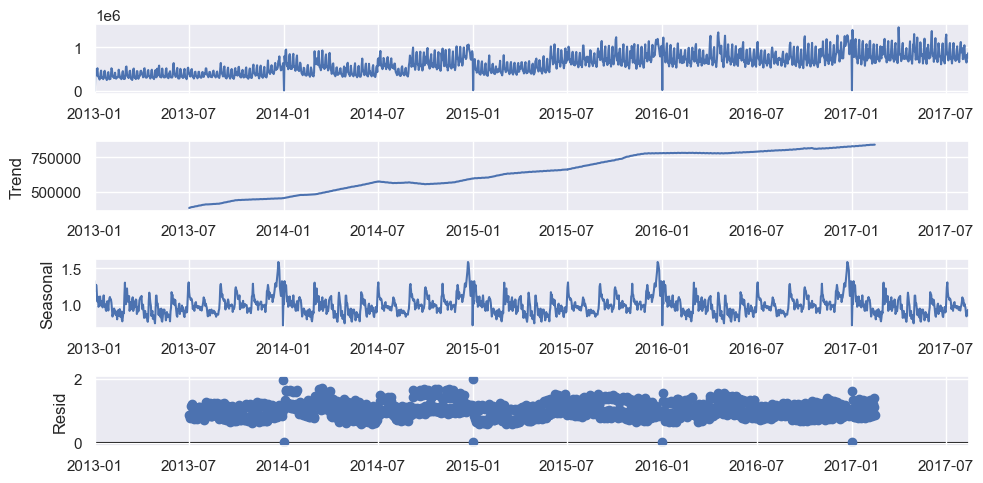

<Figure size 2000x2000 with 0 Axes>

In [322]:
decomposed_data= sma.tsa.seasonal_decompose(univar_sale, model= "multiplicative", period=365 )

decomposed_data.plot()

plt.figure(figsize= (20,20))

### 3.1.1 (c) Correlation Charts

For us to have a better forecast, it is important that the current value has a relationship with its lagged values.This is why I am plotting the autocorrelation and partial autocorrelation charts.  

##### i. ACF Graph

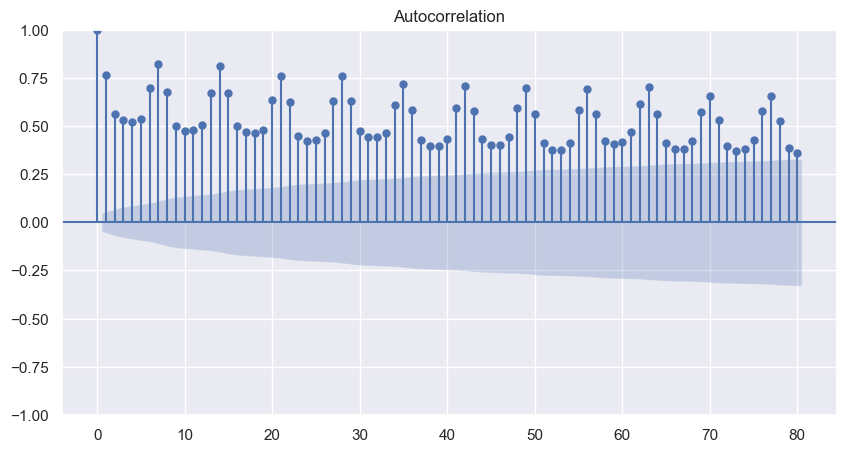

In [90]:
ACF_plot= ACF(univar_sale, lags= 80)

##### Notes: 

From our ACF we will use the q values from 1 to 15

#### ii. PACF Chart

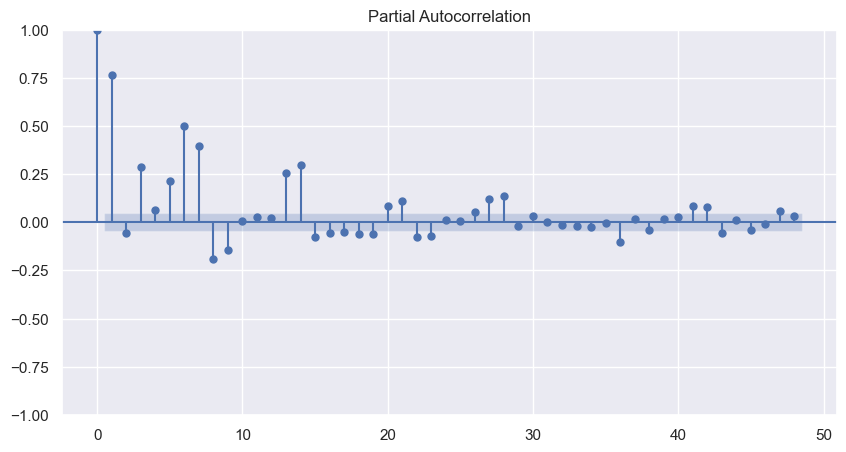

In [91]:
PACF_plot= PACF(univar_sale, lags= 48)

We can see strong Partila autocorrelation at or p values lag 1,3,5,6,7

### 3.1.1(d) Data Splitting

In [92]:



train, eval_set= train_test_split(univar_sale, test_size= 0.20, shuffle= False)

In [93]:
train

,sales
date,
2013-01-01,2.511619e+03
2013-01-02,4.960924e+05
2013-01-03,3.614612e+05
2013-01-04,3.544597e+05
2013-01-05,4.773501e+05
...,...
2016-09-07,7.385439e+05
2016-09-08,5.958493e+05
2016-09-09,6.589690e+05


### 3.1.1.(e) Using AutoArima Model

- Even though we have found our p, and q values, we will be using autoarima to figure out out these values

In [94]:


## Finding the best Arima model for the train_data

model_1= auto_arima(univar_sale, m= 12, seasonal= True, start_p= 0, start_q= 0, max_p= 10, max_q= 15, max_d= 5, d= 1,
           
                   test= "adf", error_action= "ignore"
                   , suppress_warnings= True, stepwise= True, trace= True,  information_criterion='aic')

##basically, we are telling autoarima to perform a grid-cv kinda search to find the best parameters

##stepwise= true means the model will systematically take a look at each p,d,q values set to choose the best pdq combo based on AIC

## we choose the max p,d,q per information from our pACF and ACF plot

##result



Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=44911.709, Time=3.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=45112.104, Time=0.10 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=44947.788, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=44736.513, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=45110.118, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=44940.423, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=44721.867, Time=1.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=44860.389, Time=0.57 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=44604.455, Time=3.35 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=44605.865, Time=1.57 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=6.90 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=44658.246, Time=2.25 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=44907.213, Time=1.81 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=44513.813, Time=3.03 sec
 ARIMA(1,1,

In [95]:
model_1.fit(train)

ARIMA(order=(7, 1, 6), scoring_args={}, seasonal_order=(0, 0, 0, 12),
      suppress_warnings=True)

In [96]:
##predicting over the length of our evaluation set

result_1= model_1.predict(len(eval_set))

In [97]:
result_1

1347    8.093391e+05
1348    7.348481e+05
1349    7.413826e+05
1350    6.807464e+05
1351    7.390630e+05
1352    9.471682e+05
1353    9.708063e+05
1354    7.965970e+05
1355    7.295706e+05
1356    7.388068e+05
1357    6.830408e+05
1358    7.468854e+05
1359    9.520216e+05
1360    9.721589e+05
1361    8.013740e+05
1362    7.361920e+05
1363    7.428979e+05
1364    6.894259e+05
1365    7.568680e+05
1366    9.581679e+05
1367    9.743361e+05
1368    8.066823e+05
1369    7.429612e+05
1370    7.472211e+05
1371    6.959608e+05
1372    7.668488e+05
1373    9.642292e+05
1374    9.766430e+05
1375    8.120083e+05
1376    7.496828e+05
1377    7.515684e+05
1378    7.026069e+05
1379    7.767252e+05
1380    9.702275e+05
1381    9.790154e+05
1382    8.173809e+05
1383    7.563142e+05
1384    7.559753e+05
1385    7.093229e+05
1386    7.865290e+05
1387    9.761351e+05
1388    9.814807e+05
1389    8.227697e+05
1390    7.628840e+05
1391    7.604185e+05
1392    7.161273e+05
1393    7.962389e+05
1394    9.819

In [98]:
result_1.index= eval_set.index

### 3.1.1 (f) Visualizing and Evaluating the Performance of our SARIMA model

#### i. Visualization

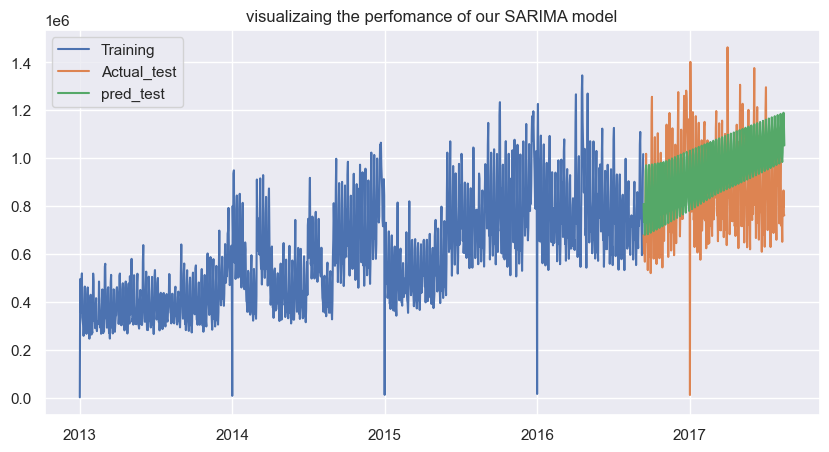

In [99]:
plt.plot(train, label= "Training")
plt.plot(eval_set, label= "Actual_test")
plt.plot(result_1, label= "pred_test")
plt.legend()
plt.title("visualizaing the perfomance of our SARIMA model")
plt.show()

##### ii. Evaluating the Performance using MAE and RMSLE

In [100]:
##Checeking the performance of the non-transformed dataset


MEA_error_1= (MAE(eval_set, result_1).round(2)/eval_set.mean())* 100

RMSLE_error_1= np.sqrt(MSLE(eval_set, result_1))


error_1= pd.DataFrame([["ARIMA", MEA_error_1, RMSLE_error_1]], columns= ["Model", "MAE", "RMSLE"])
               
error_1

,Model,MAE,RMSLE
0,ARIMA,sales 18.007507 dtype: float64,0.316087


### 3.1.1 (g) Forecasting  With SARIMA

In [101]:
model_1

ARIMA(order=(7, 1, 6), scoring_args={}, seasonal_order=(0, 0, 0, 12),
      suppress_warnings=True)

In [102]:
##creating future dates:
start_date = "2017-08-16"
end_date = "2018-02-01"

date_range = pd.date_range(start=start_date, end=end_date, freq="D")
futuredate_1 = pd.DataFrame(date_range, columns=["Dates"])

futuredate_1= futuredate_1.set_index("Dates")

In [103]:
forecast_1= model_1.predict(n_periods= len(futuredate_1))



In [104]:
forecast_1.index= futuredate_1.index

In [105]:
forecast_1

Dates
2017-08-16    8.093391e+05
2017-08-17    7.348481e+05
2017-08-18    7.413826e+05
2017-08-19    6.807464e+05
2017-08-20    7.390630e+05
2017-08-21    9.471682e+05
2017-08-22    9.708063e+05
2017-08-23    7.965970e+05
2017-08-24    7.295706e+05
2017-08-25    7.388068e+05
2017-08-26    6.830408e+05
2017-08-27    7.468854e+05
2017-08-28    9.520216e+05
2017-08-29    9.721589e+05
2017-08-30    8.013740e+05
2017-08-31    7.361920e+05
2017-09-01    7.428979e+05
2017-09-02    6.894259e+05
2017-09-03    7.568680e+05
2017-09-04    9.581679e+05
2017-09-05    9.743361e+05
2017-09-06    8.066823e+05
2017-09-07    7.429612e+05
2017-09-08    7.472211e+05
2017-09-09    6.959608e+05
2017-09-10    7.668488e+05
2017-09-11    9.642292e+05
2017-09-12    9.766430e+05
2017-09-13    8.120083e+05
2017-09-14    7.496828e+05
2017-09-15    7.515684e+05
2017-09-16    7.026069e+05
2017-09-17    7.767252e+05
2017-09-18    9.702275e+05
2017-09-19    9.790154e+05
2017-09-20    8.173809e+05
2017-09-21    7.563142

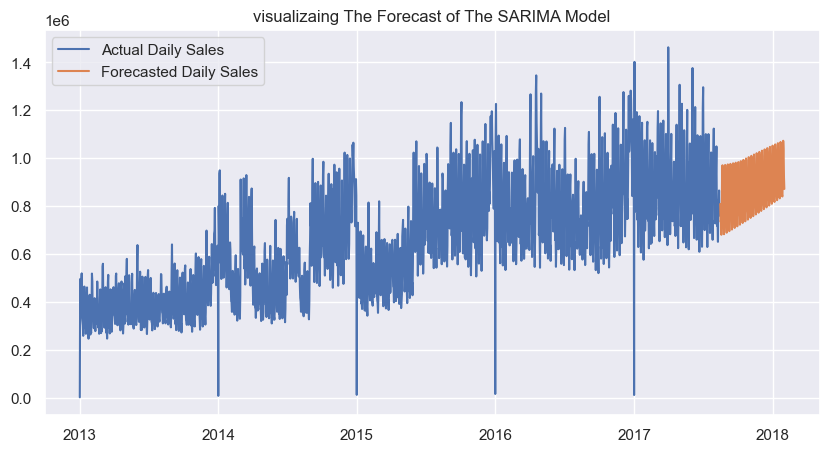

In [106]:
plt.plot(univar_sale, label= "Actual Daily Sales")
plt.plot(forecast_1, label= "Forecasted Daily Sales")
plt.legend()
plt.title("visualizaing The Forecast of The SARIMA Model")
plt.show()

#### Final Notes:

- Our model did very well
- We will also need to consider other time series to improve the performance (we will do this in the multivariate analysis)


### 3.1.2 Univariate Modeling Using Facebook Prophet

In [107]:
univar_sale

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2017-08-11,826373.722022
2017-08-12,792630.535079
2017-08-13,865639.677471


### 3.1.2 (a) Setting my ds and y Parameters

facebook prophet only accepts data with the column names ds, and y; with ds representing the date and y representing the target variable. Therefore, we will have to rename our column as such

In [350]:
fbp_sales= univar_sale.reset_index()[["date", "sales"]].rename({"date": "ds", "sales": "y"}, axis= "columns")

In [351]:
train_fbp, test_fbp= train_test_split(fbp_sales, test_size= 0.2, shuffle= False)

In [352]:
train_fbp

,ds,y
0,2013-01-01,2.511619e+03
1,2013-01-02,4.960924e+05
2,2013-01-03,3.614612e+05
3,2013-01-04,3.544597e+05
4,2013-01-05,4.773501e+05
...,...,...
1342,2016-09-07,7.385439e+05
1343,2016-09-08,5.958493e+05
1344,2016-09-09,6.589690e+05
1345,2016-09-10,9.159386e+05


In [353]:
test_fbp

,ds,y
1347,2016-09-12,6.787765e+05
1348,2016-09-13,6.034279e+05
1349,2016-09-14,6.242621e+05
1350,2016-09-15,5.683248e+05
1351,2016-09-16,6.919126e+05
1352,2016-09-17,8.992193e+05
1353,2016-09-18,1.018663e+06
1354,2016-09-19,6.811593e+05
1355,2016-09-20,6.509803e+05
1356,2016-09-21,6.669284e+05


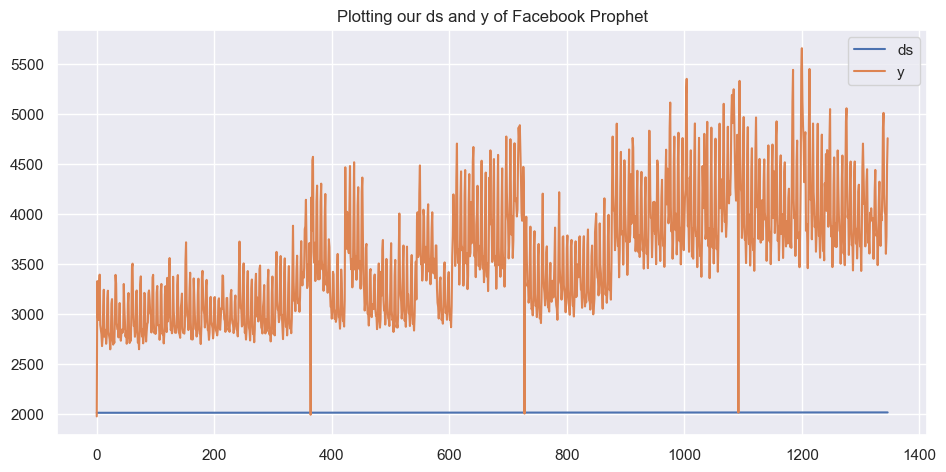

In [354]:
train_fbp.plot()
plt.title("Plotting our ds and y of Facebook Prophet")
plt.show()

### 3.1.2(b) Instantiating My Facebook Prophet Model

In [355]:
model_2= Prophet(yearly_seasonality= True, interval_width= 0.95, seasonality_prior_scale= 25)

In [356]:
model_2.fit(train_fbp)

10:49:24 - cmdstanpy - INFO - Chain [1] start processing
10:49:24 - cmdstanpy - INFO - Chain [1] done processing


In [357]:
##We will extract the date and let it predict over that so we can estimate our model's performance


test_date= pd.DataFrame(test_fbp["ds"])

In [358]:
test_date

,ds
1347,2016-09-12
1348,2016-09-13
1349,2016-09-14
1350,2016-09-15
1351,2016-09-16
1352,2016-09-17
1353,2016-09-18
1354,2016-09-19
1355,2016-09-20
1356,2016-09-21


### 3.1.2(c) Evaluating our model

In [359]:
eval_2= model_2.predict(test_date)

In [360]:
eval_2

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-09-12,805703.111258,635850.316453,1.020007e+06,805703.111258,805703.111258,14490.493337,14490.493337,14490.493337,-17562.482967,-17562.482967,-17562.482967,32052.976304,32052.976304,32052.976304,0.0,0.0,0.0,8.201936e+05
1,2016-09-13,805809.406218,577510.409481,9.763389e+05,805809.406218,805809.406218,-29002.219850,-29002.219850,-29002.219850,-62105.021870,-62105.021870,-62105.021870,33102.802020,33102.802020,33102.802020,0.0,0.0,0.0,7.768072e+05
2,2016-09-14,805915.701179,588666.014469,1.003992e+06,805911.879706,805953.468344,-9484.589596,-9484.589596,-9484.589596,-43499.455490,-43499.455490,-43499.455490,34014.865894,34014.865894,34014.865894,0.0,0.0,0.0,7.964311e+05
3,2016-09-15,806021.996139,530512.224832,9.199914e+05,805997.490960,806098.843772,-85944.811953,-85944.811953,-85944.811953,-120760.949659,-120760.949659,-120760.949659,34816.137706,34816.137706,34816.137706,0.0,0.0,0.0,7.200772e+05
4,2016-09-16,806128.291099,585912.692968,9.875010e+05,806062.244286,806251.899546,-24444.730382,-24444.730382,-24444.730382,-59975.638862,-59975.638862,-59975.638862,35530.908480,35530.908480,35530.908480,0.0,0.0,0.0,7.816836e+05
5,2016-09-17,806234.586060,751965.560731,1.175627e+06,806112.414694,806423.150008,162153.178268,162153.178268,162153.178268,125973.247532,125973.247532,125973.247532,36179.930736,36179.930736,36179.930736,0.0,0.0,0.0,9.683878e+05
6,2016-09-18,806340.881020,822382.136663,1.237173e+06,806165.232795,806613.518429,214710.016945,214710.016945,214710.016945,177930.301316,177930.301316,177930.301316,36779.715629,36779.715629,36779.715629,0.0,0.0,0.0,1.021051e+06
7,2016-09-19,806447.175980,623718.937755,1.030550e+06,806209.113821,806786.517581,19779.525622,19779.525622,19779.525622,-17562.482967,-17562.482967,-17562.482967,37342.008590,37342.008590,37342.008590,0.0,0.0,0.0,8.262267e+05
8,2016-09-20,806553.470941,586289.516229,9.787058e+05,806277.816917,806981.901155,-24231.562515,-24231.562515,-24231.562515,-62105.021870,-62105.021870,-62105.021870,37873.459354,37873.459354,37873.459354,0.0,0.0,0.0,7.823219e+05
9,2016-09-21,806659.765901,595558.004305,1.011731e+06,806278.943057,807173.011747,-5123.959532,-5123.959532,-5123.959532,-43499.455490,-43499.455490,-43499.455490,38375.495959,38375.495959,38375.495959,0.0,0.0,0.0,8.015358e+05


In [361]:
##getting the date and y_hat

result_2= eval_2[["ds", "yhat"]]

In [362]:
result_2

,ds,yhat
0,2016-09-12,8.201936e+05
1,2016-09-13,7.768072e+05
2,2016-09-14,7.964311e+05
3,2016-09-15,7.200772e+05
4,2016-09-16,7.816836e+05
5,2016-09-17,9.683878e+05
6,2016-09-18,1.021051e+06
7,2016-09-19,8.262267e+05
8,2016-09-20,7.823219e+05
9,2016-09-21,8.015358e+05


In [363]:
##making ds my index so that I can easily plot them in a sequential manner

train_fbp= train_fbp.set_index("ds")
test_fbp=  test_fbp.set_index("ds")
result_2= result_2.set_index("ds")

### 3.1.2 (g) Visualizing FBP's Performance

Text(0.5, 1.0, 'visualizaing the perfomance of our FBP model')

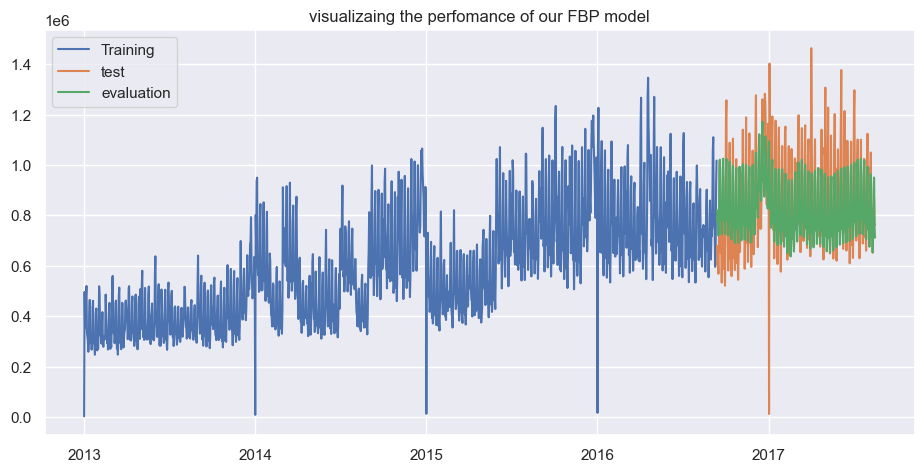

In [364]:
plt.plot(train_fbp, label= "Training")
plt.plot(test_fbp, label= "test")
plt.plot(result_2, label= "evaluation")
plt.legend()
plt.title("visualizaing the perfomance of our FBP model")




### 3.1.2(h) Evaluating My FBP Model

In [365]:

MEA_error_2= (MAE(test_fbp, result_2).round(2)/eval_set.mean())* 100

RMSLE_error_2= np.sqrt(MSLE(test_fbp, result_2))


error_2= pd.DataFrame([["Facebook Prophet", MEA_error_2, RMSLE_error_2]], columns= ["Model", "MAE", "RMSLE"])
               
error_2

,Model,MAE,RMSLE
0,Facebook Prophet,sales 10.521427 dtype: float64,0.277833


### 3.1.2(i) Forecasting with FBP

In [366]:
##the goal here is to have the model make a forecast into the future. The first step here is to create future dates


forecast_dates_2= pd.date_range(start="2017-08-16", end= "2018-01-20" )


In [367]:
forecast_dates_2

DatetimeIndex(['2017-08-16', '2017-08-17', '2017-08-18', '2017-08-19',
               '2017-08-20', '2017-08-21', '2017-08-22', '2017-08-23',
               '2017-08-24', '2017-08-25',
               ...
               '2018-01-11', '2018-01-12', '2018-01-13', '2018-01-14',
               '2018-01-15', '2018-01-16', '2018-01-17', '2018-01-18',
               '2018-01-19', '2018-01-20'],
              dtype='datetime64[ns]', length=158, freq='D')

In [368]:
##converting the above series to a dataframe
forecast_dates_2= forecast_dates_2.to_frame()

In [369]:
forecast_dates_2

,0
2017-08-16,2017-08-16
2017-08-17,2017-08-17
2017-08-18,2017-08-18
2017-08-19,2017-08-19
2017-08-20,2017-08-20
2017-08-21,2017-08-21
2017-08-22,2017-08-22
2017-08-23,2017-08-23
2017-08-24,2017-08-24
2017-08-25,2017-08-25


In [370]:
forecast_dates_2= forecast_dates_2.reset_index()

In [371]:
forecast_dates_2

,index,0
0,2017-08-16,2017-08-16
1,2017-08-17,2017-08-17
2,2017-08-18,2017-08-18
3,2017-08-19,2017-08-19
4,2017-08-20,2017-08-20
5,2017-08-21,2017-08-21
6,2017-08-22,2017-08-22
7,2017-08-23,2017-08-23
8,2017-08-24,2017-08-24
9,2017-08-25,2017-08-25


In [372]:
##I will drop the index column and rename the "0" column to "ds"

forecast_dates_2= forecast_dates_2.drop("index", axis =1)

In [373]:
###renaming the column to ds

forecast_dates_2.columns= ["ds"]

In [374]:
forecast_dates_2

,ds
0,2017-08-16
1,2017-08-17
2,2017-08-18
3,2017-08-19
4,2017-08-20
5,2017-08-21
6,2017-08-22
7,2017-08-23
8,2017-08-24
9,2017-08-25


In [133]:
forecast_2= model_2.predict(forecast_dates_2)

In [134]:
forecast_2= forecast_2[["ds", "yhat",  "yhat_upper", "yhat_lower"]]

In [135]:
##Let's make the date the index

forecast_2.set_index("ds", inplace=True)

In [136]:
fbp_sales

,ds,y
0,2013-01-01,2511.618999
1,2013-01-02,496092.417944
2,2013-01-03,361461.231124
3,2013-01-04,354459.677093
4,2013-01-05,477350.121229
...,...,...
1679,2017-08-11,826373.722022
1680,2017-08-12,792630.535079
1681,2017-08-13,865639.677471
1682,2017-08-14,760922.406081


In [137]:
print(fbp_sales["ds"].dtype)

datetime64[ns]


In [138]:
fbp_sales["ds"] = pd.to_datetime(fbp_sales["ds"])

In [139]:
fbp_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684 entries, 0 to 1683
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      1684 non-null   datetime64[ns]
 1   y       1684 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 26.4 KB


In [140]:
##making ds my index and saving it to fbp_sales_t 
fbp_sales_t= fbp_sales.set_index("ds")

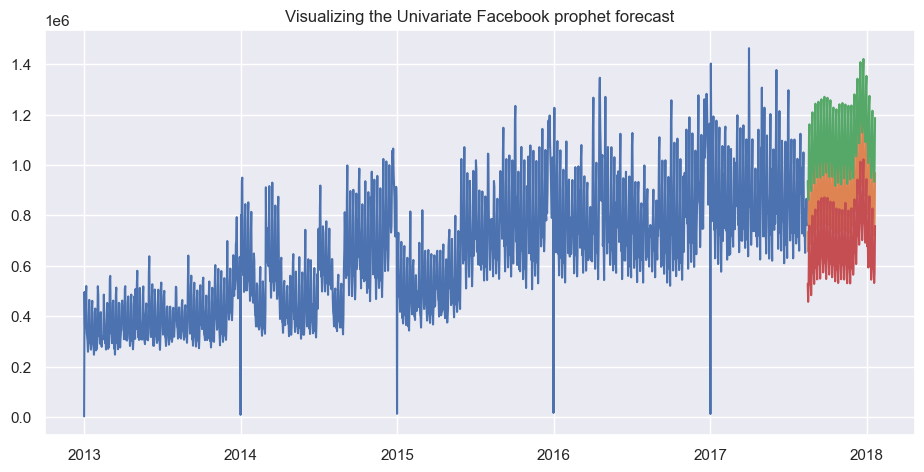

In [376]:
plt.title("Visualizing the Univariate Facebook prophet forecast")
plt.plot(fbp_sales_t, label= "train")
plt.plot(forecast_2, label= "forecast by FPB")
plt.show()


### PLottting Forecast with Facebook Prophet's inbuilt plot

In [142]:
future_date= model_2.make_future_dataframe(periods= 730, include_history= False)

In [143]:
future_date

,ds
0,2016-09-12
1,2016-09-13
2,2016-09-14
3,2016-09-15
4,2016-09-16
...,...
725,2018-09-07
726,2018-09-08
727,2018-09-09
728,2018-09-10


In [144]:
###making Facebook prophet dates

forecast_fb= model_2.predict(future_date)

In [145]:
forecast_fb[["ds","yhat","yhat_upper","yhat_lower"]]

,ds,yhat,yhat_upper,yhat_lower
0,2016-09-12,8.200742e+05,1.021034e+06,602400.636652
1,2016-09-13,7.766854e+05,9.725570e+05,579677.710100
2,2016-09-14,7.963112e+05,9.983226e+05,592377.218838
3,2016-09-15,7.199671e+05,9.196633e+05,513352.149285
4,2016-09-16,7.815813e+05,9.791372e+05,570956.236173
...,...,...,...,...
725,2018-09-07,8.458530e+05,1.219392e+06,467390.517196
726,2018-09-08,1.034217e+06,1.420184e+06,662535.830295
727,2018-09-09,1.088305e+06,1.436737e+06,725659.411846
728,2018-09-10,8.946784e+05,1.262000e+06,511146.636158


In [146]:
plot_plotly(model_2,forecast_fb,)

In [147]:
plot_components_plotly(model_2, forecast_fb)

## 3.2 Multivariate Forecasting

The idea here is to see how the other columns (exogenous variables) affect sales. We believe this will actually improve the accuracy of our models

##### Workflow:

- First, we will have an overview all the datasets again
- We will merge only the time series datasets since we are doing multivariate
- We will also do some prelimenary feature selection using granger's causality test
- Afterwards we will perform some feature engineering
- For models such as decision tree that has in-built feature selection we will leverage that as well

The algorithms we will be using for our modelling include:

- SARIMAX
- Facebook Prophet
- Decision Tree
- Random Forest

### 3.2.1 Overview of datasets

In [148]:
oil

,dcoilwtico
date,
2013-01-01,93.14
2013-01-02,93.14
2013-01-03,92.97
2013-01-04,93.12
2013-01-07,93.20
...,...
2017-08-25,47.65
2017-08-28,46.40
2017-08-29,46.46


In [149]:
oil= oil.reset_index()

In [150]:
oil

,date,dcoilwtico
0,2013-01-01,93.14
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [151]:
transactions


,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [152]:
df_train

,id,date,store_nbr,family,sales,onpromotion,month
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1
1,1,2013-01-01,1,BABY CARE,0.000,0,1
2,2,2013-01-01,1,BEAUTY,0.000,0,1
3,3,2013-01-01,1,BEVERAGES,0.000,0,1
4,4,2013-01-01,1,BOOKS,0.000,0,1
...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,8
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,8
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,8
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,8


In [153]:
store

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [154]:
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


### 3.2.2 Merging The Dataframes

We will only be considering:
 
- transaction
- oil
- train
- holidays
 
 
Also, since we have our target(sales) in the transaction column, we are going to filter all other datasets (from 2013-01-01 to 2017-08-15) to match the date of our train dataset. Doing this will help us see how the other variables affect our sales within the same time period. 

Also, we won't be considering the store dataset because we won't be forecasting the sales for each product across each store. We are trying to forecast the unit sales across all stores of favorita 

#### i. Filtering out dates that are only in our Train dataframes

In [155]:

transac_train= transactions[(transactions["date"]>="2013-01-01") & (transactions["date"]<= "2017-08-15")]
oil_train= oil[(oil["date"]>="2013-01-01") & (oil["date"]<= "2017-08-15")]
holiday_train= holidays[(holidays["date"]>="2013-01-01") & (holidays["date"]<= "2017-08-15")]

#### ii. Merging our datasets

In [156]:
merged_data1= pd.merge(df_train, transac_train, how= "outer", on= ["date", "store_nbr"])

merged_data2= pd.merge(merged_data1, holiday_train, how= "outer", on= "date")

merged_data3=  pd.merge(merged_data2, oil_train, how= "outer", on= "date")

In [157]:
merged_data3

,id,date,store_nbr,family,sales,onpromotion,month,transactions,type,locale,locale_name,description,transferred,dcoilwtico
0,0.0,2013-01-01,1.0,AUTOMOTIVE,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,1.0,2013-01-01,1.0,BABY CARE,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,2.0,2013-01-01,1.0,BEAUTY,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,3.0,2013-01-01,1.0,BEVERAGES,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,4.0,2013-01-01,1.0,BOOKS,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3054347,3000887.0,2017-08-15,9.0,SEAFOOD,16.0,0.0,8.0,2155.0,Holiday,Local,Riobamba,Fundacion de Riobamba,False,47.57
3054348,NaN,2013-12-25,NaN,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,99.18
3054349,NaN,2014-12-25,NaN,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,54.59
3054350,NaN,2015-12-25,NaN,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,36.36


##### iii.Dropping certain features

In [158]:
##We will be dropping the store number and family column since we won't need them

merged_data= merged_data3.drop(["family", "store_nbr", "month"], axis= 1)

In [159]:
merged_data

,id,date,sales,onpromotion,transactions,type,locale,locale_name,description,transferred,dcoilwtico
0,0.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,1.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,2.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,3.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,4.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
...,...,...,...,...,...,...,...,...,...,...,...
3054347,3000887.0,2017-08-15,16.0,0.0,2155.0,Holiday,Local,Riobamba,Fundacion de Riobamba,False,47.57
3054348,NaN,2013-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,99.18
3054349,NaN,2014-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,54.59
3054350,NaN,2015-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,36.36


In [160]:
merged_data= merged_data.drop("id", axis= 1)

In [161]:
merged_data

,date,sales,onpromotion,transactions,type,locale,locale_name,description,transferred,dcoilwtico
0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
...,...,...,...,...,...,...,...,...,...,...
3054347,2017-08-15,16.0,0.0,2155.0,Holiday,Local,Riobamba,Fundacion de Riobamba,False,47.57
3054348,2013-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,99.18
3054349,2014-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,54.59
3054350,2015-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,36.36


#### iv.Handling missing values

In [162]:
merged_data.isna().sum()

date                  0
sales                 4
onpromotion           4
transactions     249121
type            2551824
locale          2551824
locale_name     2551824
description     2551824
transferred     2551824
dcoilwtico       878527
dtype: int64

In [163]:
merged_data= merged_data.dropna(subset=["sales", "onpromotion"])

In [164]:
##For transactions, we will replace the na values with 0 since it means no transaction was recorded on the said date

merged_data["transactions"]= merged_data["transactions"].replace(np.nan, 0)

In [165]:
##We will be dropping the locale_name and description of holiday

merged_data= merged_data.drop(["locale_name", "description"], axis= 1)

In [166]:

merged_data.isna().sum()

date                  0
sales                 0
onpromotion           0
transactions          0
type            2551824
locale          2551824
transferred     2551824
dcoilwtico       878526
dtype: int64

With the holiday attributes, we will replace all the missing rows with not holidays, and for the transferred we will replace the missing rows with false since they were transferred as well. 

With the dcoilwtico, since the values closely match, we will perform a backfill

In [167]:

merged_data["type"]=merged_data["type"].replace(np.nan, "Not Holiday")

merged_data["locale"]=merged_data["locale"].replace(np.nan, "Not Holiday")

merged_data["transferred"]=merged_data["transferred"].replace(np.nan, "False")

merged_data["dcoilwtico"]= merged_data["dcoilwtico"].fillna(method= "bfill")


In [168]:
merged_data.isna().sum()

date            0
sales           0
onpromotion     0
transactions    0
type            0
locale          0
transferred     0
dcoilwtico      0
dtype: int64

In [169]:
##let's rename the type column to holiday type

merged_data= merged_data.rename(columns= {"type": "holiday"})

In [170]:
merged_data.columns

Index(['date', 'sales', 'onpromotion', 'transactions', 'holiday', 'locale',
       'transferred', 'dcoilwtico'],
      dtype='object')

### 3.2.3 Feature Selection using Granger Causality Test


Granger causality test is a test which validates the fact that one time series has an effect on another time series. I think this will be a good metric since we want our model to be as accurate as possible. 

Note the following:

- the null hypothesis is that y(the second variable) doesn't cause x. Therefore if the p-value is greater than 0.05 we accept the hypothesis, else we reject it. 

- We will be performing the test over 20 lags to help us make an informed decision

##### Assumptions:

We are going to assume holidays have an effect on sales. Therefore, we will check the causality of only the numeric columns

#### i. Aggregating The Rows of the Column

In [171]:
##I am going to aggregate and group the columns by date to make the causality test easy

In [172]:
merged= merged_data.groupby(["date", "holiday","locale", "transferred" ]).agg({"sales": "sum", "onpromotion": "sum","transactions": "sum","dcoilwtico": "mean" })

In [173]:
merged

,,,,sales,onpromotion,transactions,dcoilwtico
date,holiday,locale,transferred,,,,
2013-01-01,Holiday,National,False,2511.618999,0.0,25410.0,93.14
2013-01-02,Not Holiday,Not Holiday,False,496092.417944,0.0,3076095.0,93.14
2013-01-03,Not Holiday,Not Holiday,False,361461.231124,0.0,2590632.0,92.97
2013-01-04,Not Holiday,Not Holiday,False,354459.677093,0.0,2590302.0,93.12
2013-01-05,Work Day,National,False,477350.121229,0.0,3087909.0,93.20
...,...,...,...,...,...,...,...
2017-08-11,Transfer,National,False,826373.722022,14179.0,2955183.0,48.81
2017-08-12,Not Holiday,Not Holiday,False,792630.535079,8312.0,2967591.0,47.59
2017-08-13,Not Holiday,Not Holiday,False,865639.677471,9283.0,2837769.0,47.59


In [174]:
merged= merged.reset_index()

In [175]:
merged= merged.set_index("date")

In [176]:
merged

,holiday,locale,transferred,sales,onpromotion,transactions,dcoilwtico
date,,,,,,,
2013-01-01,Holiday,National,False,2511.618999,0.0,25410.0,93.14
2013-01-02,Not Holiday,Not Holiday,False,496092.417944,0.0,3076095.0,93.14
2013-01-03,Not Holiday,Not Holiday,False,361461.231124,0.0,2590632.0,92.97
2013-01-04,Not Holiday,Not Holiday,False,354459.677093,0.0,2590302.0,93.12
2013-01-05,Work Day,National,False,477350.121229,0.0,3087909.0,93.20
...,...,...,...,...,...,...,...
2017-08-11,Transfer,National,False,826373.722022,14179.0,2955183.0,48.81
2017-08-12,Not Holiday,Not Holiday,False,792630.535079,8312.0,2967591.0,47.59
2017-08-13,Not Holiday,Not Holiday,False,865639.677471,9283.0,2837769.0,47.59


#### ii.Performing the test

In [177]:
##Let's perform our causality test

In [178]:
gran_result_1= grangercausalitytests(merged[["sales", "onpromotion"]], maxlag= 20, verbose= False)


In [179]:
gran_result_1

{1: ({'ssr_ftest': (103.20893433612063, 1.4012891568716958e-23, 1699.0, 1),
   'ssr_chi2test': (103.39117495001608, 2.7509739536125104e-24, 1),
   'lrtest': (100.37248099318822, 1.2627035668421978e-23, 1),
   'params_ftest': (103.20893433612105, 1.401289156871397e-23, 1699.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (134.94330047900272, 4.126128268327989e-55, 1696.0, 2),
   'ssr_chi2test': (270.68225721082973, 1.6676106963697826e-59, 2),
   'lrtest': (251.18803523843235, 2.8524049925153823e-55, 2),
   'params_ftest': (134.94330047900348, 4.126128268324881e-55, 1696.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (108.90722089684624, 1.7826498825082707e-64, 1693.0, 3),
   'ssr_chi2test': (328.0725496597258, 8.340532780870098e-71, 3),
   'lrtest': (299.97793363542587, 1.0058765068363655e-64, 3),
   'params_ftest': (108.90722089684637, 1.7826498825078146e-64, 1693.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0.,

In [180]:
for lag in gran_result_1.keys():
    print(f"Lag {lag}:")
    print(f"F-statistic: {gran_result_1[lag][0]['params_ftest'][0]}")
    print(f"Critical values: {gran_result_1[lag][0]['params_ftest'][1:]}")
    print(f"P-value: {gran_result_1[lag][0]['params_ftest'][1]}")
    print()

Lag 1:
F-statistic: 103.20893433612105
Critical values: (1.401289156871397e-23, 1699.0, 1.0)
P-value: 1.401289156871397e-23

Lag 2:
F-statistic: 134.94330047900348
Critical values: (4.126128268324881e-55, 1696.0, 2.0)
P-value: 4.126128268324881e-55

Lag 3:
F-statistic: 108.90722089684637
Critical values: (1.7826498825078146e-64, 1693.0, 3.0)
P-value: 1.7826498825078146e-64

Lag 4:
F-statistic: 90.67625579579192
Critical values: (6.688327853225386e-70, 1690.0, 4.0)
P-value: 6.688327853225386e-70

Lag 5:
F-statistic: 82.95320613349206
Critical values: (4.831425335861109e-78, 1687.0, 5.0)
P-value: 4.831425335861109e-78

Lag 6:
F-statistic: 71.38526658285537
Critical values: (2.0091374294226924e-79, 1684.0, 6.0)
P-value: 2.0091374294226924e-79

Lag 7:
F-statistic: 30.47854224272859
Critical values: (6.541547849329343e-40, 1681.0, 7.0)
P-value: 6.541547849329343e-40

Lag 8:
F-statistic: 29.168247542055493
Critical values: (6.671016390878378e-43, 1678.0, 8.0)
P-value: 6.671016390878378e-43



#### Our Findings for the causality between sales and onpromotion:

- Over 20 lags, our p-value seem to be less than 0.05;therefore, we reject the null hypothesis for granger causality

- Also, since the p-value is less than 0.05, we accep the null hypothesis of our project, which is onpromotion has an effect on sales.

In basic terms, on-promotion has a causal effect on sales;therefore, we keep it

In [181]:
gran_result_2= grangercausalitytests(merged[["sales", "transactions"]], maxlag= 20, verbose= False)


In [182]:
gran_result_2

{1: ({'ssr_ftest': (89.9043774822756, 8.090881425762394e-21, 1699.0, 1),
   'ssr_chi2test': (90.06312564734142, 2.3068122392988646e-21, 1),
   'lrtest': (87.76109426990297, 7.385749828878128e-21, 1),
   'params_ftest': (89.90437748226036, 8.090881425821723e-21, 1699.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (52.93618075236795, 5.0020365530931137e-23, 1696.0, 2),
   'ssr_chi2test': (106.18448521200222, 8.756529282883082e-24, 2),
   'lrtest': (103.00199293615151, 4.2993363379975035e-23, 2),
   'params_ftest': (52.93618075236527, 5.0020365531051266e-23, 1696.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (35.80843532795205, 1.9561196183773678e-22, 1693.0, 3),
   'ssr_chi2test': (107.86947440788862, 3.1535676869971835e-23, 3),
   'lrtest': (104.58538540357404, 1.604509280190379e-22, 3),
   'params_ftest': (35.80843532794179, 1.9561196184052632e-22, 1693.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 

In [183]:
for lag in gran_result_2.keys():
    print(f"Lag {lag}:")
    print(f"F-statistic: {gran_result_2[lag][0]['params_ftest'][0]}")
    print(f"Critical values: {gran_result_2[lag][0]['params_ftest'][1:]}")
    print(f"P-value: {gran_result_2[lag][0]['params_ftest'][1]}")
    print()

Lag 1:
F-statistic: 89.90437748226036
Critical values: (8.090881425821723e-21, 1699.0, 1.0)
P-value: 8.090881425821723e-21

Lag 2:
F-statistic: 52.93618075236527
Critical values: (5.0020365531051266e-23, 1696.0, 2.0)
P-value: 5.0020365531051266e-23

Lag 3:
F-statistic: 35.80843532794179
Critical values: (1.9561196184052632e-22, 1693.0, 3.0)
P-value: 1.9561196184052632e-22

Lag 4:
F-statistic: 23.68662369137413
Critical values: (4.400575857338455e-19, 1690.0, 4.0)
P-value: 4.400575857338455e-19

Lag 5:
F-statistic: 24.827271470771024
Critical values: (3.315860047506714e-24, 1687.0, 5.0)
P-value: 3.315860047506714e-24

Lag 6:
F-statistic: 20.938240031278
Critical values: (8.659682862329463e-24, 1684.0, 6.0)
P-value: 8.659682862329463e-24

Lag 7:
F-statistic: 10.583191338582017
Critical values: (4.3917757193922965e-13, 1681.0, 7.0)
P-value: 4.3917757193922965e-13

Lag 8:
F-statistic: 28.621116566498984
Critical values: (4.346167902847133e-42, 1678.0, 8.0)
P-value: 4.346167902847133e-42

L

#### Our Findings for the causality between sales and transaction:

- Over 20 lags, our p-value seem to be less than 0.05;therefore, we reject the null hypothesis.

In basic terms, transaction has a causal effect on sales;therefore, we keep it

In [184]:
gran_result_3= grangercausalitytests(merged[["sales", "dcoilwtico"]], maxlag= 20, verbose= False)


In [185]:
gran_result_3

{1: ({'ssr_ftest': (168.42279223040748, 8.615920157363876e-37, 1699.0, 1),
   'ssr_chi2test': (168.7201838588308, 1.4083063659741052e-38, 1),
   'lrtest': (160.8721066774815, 7.296367003949172e-37, 1),
   'params_ftest': (168.4227922304081, 8.615920157361917e-37, 1699.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (91.52476099596376, 1.792682541701409e-38, 1696.0, 2),
   'ssr_chi2test': (183.58917270534712, 1.361813635801004e-40, 2),
   'lrtest': (174.34150850927836, 1.387466301497571e-38, 2),
   'params_ftest': (91.52476099595154, 1.7926825417212293e-38, 1696.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (44.02874174904738, 2.1439925378622883e-27, 1693.0, 3),
   'ssr_chi2test': (132.63235848797498, 1.4647121111443374e-28, 3),
   'lrtest': (127.7127201128169, 1.6824951561982133e-27, 3),
   'params_ftest': (44.028741749043554, 2.1439925378734855e-27, 1693.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0.,

In [186]:
##looping through to figure out my f-stat, critical value, and p-value

for lag in gran_result_3.keys():
    print(f"Lag {lag}:")
    print(f"F-statistic: {gran_result_3[lag][0]['params_ftest'][0]}")
    print(f"Critical values: {gran_result_3[lag][0]['params_ftest'][1:]}")
    print(f"P-value: {gran_result_3[lag][0]['params_ftest'][1]}")
    print()

Lag 1:
F-statistic: 168.4227922304081
Critical values: (8.615920157361917e-37, 1699.0, 1.0)
P-value: 8.615920157361917e-37

Lag 2:
F-statistic: 91.52476099595154
Critical values: (1.7926825417212293e-38, 1696.0, 2.0)
P-value: 1.7926825417212293e-38

Lag 3:
F-statistic: 44.028741749043554
Critical values: (2.1439925378734855e-27, 1693.0, 3.0)
P-value: 2.1439925378734855e-27

Lag 4:
F-statistic: 28.259060605435216
Critical values: (9.390557030748737e-23, 1690.0, 4.0)
P-value: 9.390557030748737e-23

Lag 5:
F-statistic: 16.58994351263499
Critical values: (5.068242606592518e-16, 1687.0, 5.0)
P-value: 5.068242606592518e-16

Lag 6:
F-statistic: 6.829691452815372
Critical values: (3.574401191146233e-07, 1684.0, 6.0)
P-value: 3.574401191146233e-07

Lag 7:
F-statistic: 2.7243571039971863
Critical values: (0.008214640909998341, 1681.0, 7.0)
P-value: 0.008214640909998341

Lag 8:
F-statistic: 2.709165242300286
Critical values: (0.005771458526760011, 1678.0, 8.0)
P-value: 0.005771458526760011

Lag 9

#### Our Findings for the causality between oil and onpromotion:

- Over 20 lags, our p-value seem to be greater than 0.05 from the 14th lag;therefore, we accept the null hypothesis amd drop the column

In basic terms, oil has no causal effect on sales;therefore, we drop it

In [187]:
##dropping the oil feature since we do not need it

final_data= merged.drop("dcoilwtico", axis= 1)

In [188]:
##final_data.to_csv("Desktop/final_dataset.csv")

## 3.2.4 Feature Processing

In this section, we will:
    
- Create new features, and encode our categorical column

### 3.2.4(a).Splitting My Dataset

In [189]:
multi_train, multi_test=train_test_split(final_data, test_size= 0.20, shuffle= False)

In [190]:
multi_train

,holiday,locale,transferred,sales,onpromotion,transactions
date,,,,,,
2013-01-01,Holiday,National,False,2.511619e+03,0.0,25410.0
2013-01-02,Not Holiday,Not Holiday,False,4.960924e+05,0.0,3076095.0
2013-01-03,Not Holiday,Not Holiday,False,3.614612e+05,0.0,2590632.0
2013-01-04,Not Holiday,Not Holiday,False,3.544597e+05,0.0,2590302.0
2013-01-05,Work Day,National,False,4.773501e+05,0.0,3087909.0
...,...,...,...,...,...,...
2016-09-07,Not Holiday,Not Holiday,False,7.385439e+05,12437.0,2630727.0
2016-09-08,Not Holiday,Not Holiday,False,5.958493e+05,5757.0,2483646.0
2016-09-09,Not Holiday,Not Holiday,False,6.589690e+05,11435.0,2626932.0


### 3.2.4(b).Feature Encoding

#### Workflow:
    
    - I will be using a Label encoder for my transferred column since it consist of True and False
    - I will be using an ordinal encoder for my locale column since it consist of heirachial holiday. eg National > Local
    - I will be using a binary encoder for my holiday column since it consist of numerous variables

#### i.Encoding the transferred column

- As stated earlier, I will be using a label encoder since it consist of only two columns

In [191]:
multi_train["transferred"].unique()

array([False, 'False', True], dtype=object)

- we can see there are three unique values instead of 2 a string False and a Boolean False therefore we will replace the string false with the boolean version before we pass it through our encoder 

In [192]:
multi_train["transferred"]= multi_train["transferred"].replace("False", False)

In [193]:
LE= LabelEncoder()

In [194]:
multi_train["transferred"]=LE.fit_transform(multi_train["transferred"])

In [195]:
multi_test["transferred"]= LE.transform(multi_test["transferred"])

In [196]:
##checking to ensure the change has reflected

In [197]:
multi_train

,holiday,locale,transferred,sales,onpromotion,transactions
date,,,,,,
2013-01-01,Holiday,National,0,2.511619e+03,0.0,25410.0
2013-01-02,Not Holiday,Not Holiday,0,4.960924e+05,0.0,3076095.0
2013-01-03,Not Holiday,Not Holiday,0,3.614612e+05,0.0,2590632.0
2013-01-04,Not Holiday,Not Holiday,0,3.544597e+05,0.0,2590302.0
2013-01-05,Work Day,National,0,4.773501e+05,0.0,3087909.0
...,...,...,...,...,...,...
2016-09-07,Not Holiday,Not Holiday,0,7.385439e+05,12437.0,2630727.0
2016-09-08,Not Holiday,Not Holiday,0,5.958493e+05,5757.0,2483646.0
2016-09-09,Not Holiday,Not Holiday,0,6.589690e+05,11435.0,2626932.0


In [198]:
multi_test

,holiday,locale,transferred,sales,onpromotion,transactions
date,,,,,,
2016-09-12,Not Holiday,Not Holiday,1,6.787765e+05,5902.0,2545125.0
2016-09-13,Not Holiday,Not Holiday,1,6.034279e+05,7836.0,2443056.0
2016-09-14,Not Holiday,Not Holiday,1,6.242621e+05,13238.0,2412168.0
2016-09-15,Not Holiday,Not Holiday,1,5.683248e+05,8373.0,2466453.0
2016-09-16,Not Holiday,Not Holiday,1,6.919126e+05,14453.0,2666037.0
2016-09-17,Not Holiday,Not Holiday,1,8.992193e+05,9645.0,3111834.0
2016-09-18,Not Holiday,Not Holiday,1,1.018663e+06,10453.0,3048375.0
2016-09-19,Not Holiday,Not Holiday,1,6.811593e+05,8924.0,2516415.0
2016-09-20,Not Holiday,Not Holiday,1,6.509803e+05,10992.0,2526876.0


In [199]:
##saving this dataframe 

multi_test.to_csv("Desktop/multi_test.csv")

#### ii. Encoding the holiday attribute:

In [200]:
final_data["holiday"].unique()

array(['Holiday', 'Not Holiday', 'Work Day', 'Additional', 'Event',
       'Transfer', 'Bridge'], dtype=object)

Since there are various attributes in the column, we will use a binary encoder

In [201]:
##creating an instance and telling the encoder which column to target 

BE= BinaryEncoder(cols= "holiday")

In [202]:
##perfoming encoding 

multi_train= BE.fit_transform(multi_train)

In [203]:
multi_test= BE.transform(multi_test)

In [204]:
##checking to ensure the change has reflected:
multi_train


,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
date,,,,,,,,
2013-01-01,0,0,1,National,0,2.511619e+03,0.0,25410.0
2013-01-02,0,1,0,Not Holiday,0,4.960924e+05,0.0,3076095.0
2013-01-03,0,1,0,Not Holiday,0,3.614612e+05,0.0,2590632.0
2013-01-04,0,1,0,Not Holiday,0,3.544597e+05,0.0,2590302.0
2013-01-05,0,1,1,National,0,4.773501e+05,0.0,3087909.0
...,...,...,...,...,...,...,...,...
2016-09-07,0,1,0,Not Holiday,0,7.385439e+05,12437.0,2630727.0
2016-09-08,0,1,0,Not Holiday,0,5.958493e+05,5757.0,2483646.0
2016-09-09,0,1,0,Not Holiday,0,6.589690e+05,11435.0,2626932.0


In [205]:
multi_test

,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
date,,,,,,,,
2016-09-12,0,1,0,Not Holiday,1,6.787765e+05,5902.0,2545125.0
2016-09-13,0,1,0,Not Holiday,1,6.034279e+05,7836.0,2443056.0
2016-09-14,0,1,0,Not Holiday,1,6.242621e+05,13238.0,2412168.0
2016-09-15,0,1,0,Not Holiday,1,5.683248e+05,8373.0,2466453.0
2016-09-16,0,1,0,Not Holiday,1,6.919126e+05,14453.0,2666037.0
2016-09-17,0,1,0,Not Holiday,1,8.992193e+05,9645.0,3111834.0
2016-09-18,0,1,0,Not Holiday,1,1.018663e+06,10453.0,3048375.0
2016-09-19,0,1,0,Not Holiday,1,6.811593e+05,8924.0,2516415.0
2016-09-20,0,1,0,Not Holiday,1,6.509803e+05,10992.0,2526876.0


#### iii. Encoding The Locale Column

In [206]:
final_data["locale"].unique()

array(['National', 'Not Holiday', 'Local', 'Regional'], dtype=object)

This looks heiriacal; therefore, I will use national as the highest value, and not holiday having the lowest value

In [207]:
##creating a rank
rank= ["National", "Regional", "Local", "Not Holiday"]

In [208]:
##creating an instance
OE= OrdinalEncoder(categories=[rank])

In [209]:
##let's encode

##I am using two square-brackets because the ordinal-encoder takes two-d arrays 

multi_train[["locale"]] = OE.fit_transform(multi_train[["locale"]].values)


In [210]:
##transforming my test
multi_test[["locale"]]=OE.transform(multi_test[["locale"]])

In [211]:

multi_test


,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
date,,,,,,,,
2016-09-12,0,1,0,3.0,1,6.787765e+05,5902.0,2545125.0
2016-09-13,0,1,0,3.0,1,6.034279e+05,7836.0,2443056.0
2016-09-14,0,1,0,3.0,1,6.242621e+05,13238.0,2412168.0
2016-09-15,0,1,0,3.0,1,5.683248e+05,8373.0,2466453.0
2016-09-16,0,1,0,3.0,1,6.919126e+05,14453.0,2666037.0
2016-09-17,0,1,0,3.0,1,8.992193e+05,9645.0,3111834.0
2016-09-18,0,1,0,3.0,1,1.018663e+06,10453.0,3048375.0
2016-09-19,0,1,0,3.0,1,6.811593e+05,8924.0,2516415.0
2016-09-20,0,1,0,3.0,1,6.509803e+05,10992.0,2526876.0


In [212]:
multi_train

,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
date,,,,,,,,
2013-01-01,0,0,1,0.0,0,2.511619e+03,0.0,25410.0
2013-01-02,0,1,0,3.0,0,4.960924e+05,0.0,3076095.0
2013-01-03,0,1,0,3.0,0,3.614612e+05,0.0,2590632.0
2013-01-04,0,1,0,3.0,0,3.544597e+05,0.0,2590302.0
2013-01-05,0,1,1,0.0,0,4.773501e+05,0.0,3087909.0
...,...,...,...,...,...,...,...,...
2016-09-07,0,1,0,3.0,0,7.385439e+05,12437.0,2630727.0
2016-09-08,0,1,0,3.0,0,5.958493e+05,5757.0,2483646.0
2016-09-09,0,1,0,3.0,0,6.589690e+05,11435.0,2626932.0


<Axes: xlabel='date'>

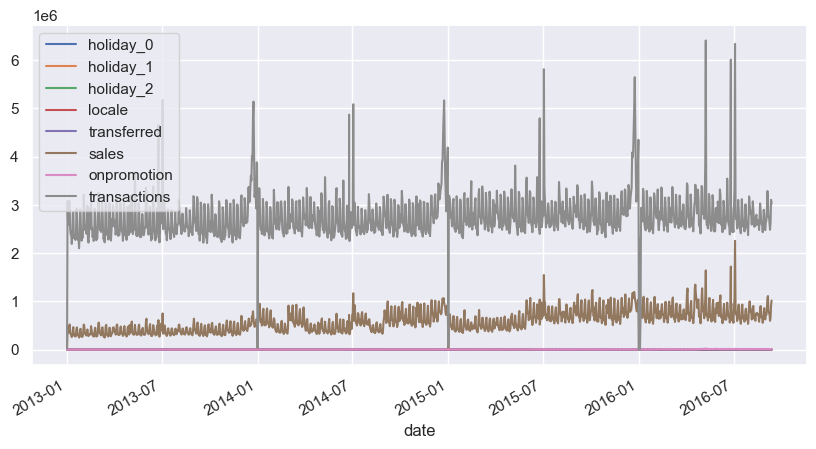

In [213]:
multi_train.plot()

In [214]:
##Last check for missing valuesin my train data 

multi_train.isna().sum()

holiday_0       0
holiday_1       0
holiday_2       0
locale          0
transferred     0
sales           0
onpromotion     0
transactions    0
dtype: int64

In [215]:
###checeking for missing values in my test data

multi_test.isna().sum()

holiday_0       0
holiday_1       0
holiday_2       0
locale          0
transferred     0
sales           0
onpromotion     0
transactions    0
dtype: int64

In [216]:
##since we will be using the date to create new features, we will reset our index
multi_test=multi_test.reset_index()
multi_train=multi_train.reset_index()

### 3.2.5 Modeling 

In this section, we are going to compare one statistical method with two machine learning models. 

##### Here we will develop a model using:

- Facebook Prophet
- SARIMAX
- Decision Trees
- Random Forest
- XGBoost

Again,we are trying to see if our statistical models outperform our machine learning models in multivariate

### 3.2.5(a) Multivariate With Facebook Prophet

In [217]:
multi_test

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
0,2016-09-12,0,1,0,3.0,1,6.787765e+05,5902.0,2545125.0
1,2016-09-13,0,1,0,3.0,1,6.034279e+05,7836.0,2443056.0
2,2016-09-14,0,1,0,3.0,1,6.242621e+05,13238.0,2412168.0
3,2016-09-15,0,1,0,3.0,1,5.683248e+05,8373.0,2466453.0
4,2016-09-16,0,1,0,3.0,1,6.919126e+05,14453.0,2666037.0
5,2016-09-17,0,1,0,3.0,1,8.992193e+05,9645.0,3111834.0
6,2016-09-18,0,1,0,3.0,1,1.018663e+06,10453.0,3048375.0
7,2016-09-19,0,1,0,3.0,1,6.811593e+05,8924.0,2516415.0
8,2016-09-20,0,1,0,3.0,1,6.509803e+05,10992.0,2526876.0
9,2016-09-21,0,1,0,3.0,1,6.669284e+05,16166.0,2516580.0


In [218]:
multi_train

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
0,2013-01-01,0,0,1,0.0,0,2.511619e+03,0.0,25410.0
1,2013-01-02,0,1,0,3.0,0,4.960924e+05,0.0,3076095.0
2,2013-01-03,0,1,0,3.0,0,3.614612e+05,0.0,2590632.0
3,2013-01-04,0,1,0,3.0,0,3.544597e+05,0.0,2590302.0
4,2013-01-05,0,1,1,0.0,0,4.773501e+05,0.0,3087909.0
...,...,...,...,...,...,...,...,...,...
1357,2016-09-07,0,1,0,3.0,0,7.385439e+05,12437.0,2630727.0
1358,2016-09-08,0,1,0,3.0,0,5.958493e+05,5757.0,2483646.0
1359,2016-09-09,0,1,0,3.0,0,6.589690e+05,11435.0,2626932.0
1360,2016-09-10,0,1,0,3.0,0,9.159386e+05,6595.0,3105795.0


In [219]:
###I am going to rename my column to FBP requirements 

fbp_train= multi_train.rename(columns={"date": "ds", "sales": "y"})

fbp_test= multi_test.rename(columns={"date": "ds", "sales": "y"})

In [220]:
fbp_train.columns

Index(['ds', 'holiday_0', 'holiday_1', 'holiday_2', 'locale', 'transferred',
       'y', 'onpromotion', 'transactions'],
      dtype='object')

#### i.Getting my exo and endo varibles for my FBP Model

In [377]:
model_3= Prophet(yearly_seasonality= True,seasonality_mode= "multiplicative", seasonality_prior_scale=20 )

In [378]:
##getting a list of all our exogenous variables 
exo_cols=[ 'holiday_0', 'holiday_1', 'holiday_2', 'locale', 'transferred', 'onpromotion', 'transactions']

In [379]:
for cols in exo_cols:
    model_3.add_regressor(cols, standardize= True)

In [380]:
model_3.extra_regressors

OrderedDict([('holiday_0',
              {'prior_scale': 10.0,
               'standardize': True,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'multiplicative'}),
             ('holiday_1',
              {'prior_scale': 10.0,
               'standardize': True,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'multiplicative'}),
             ('holiday_2',
              {'prior_scale': 10.0,
               'standardize': True,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'multiplicative'}),
             ('locale',
              {'prior_scale': 10.0,
               'standardize': True,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'multiplicative'}),
             ('transferred',
              {'prior_scale': 10.0,
               'standardize': True,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'multiplicative'}),
             ('onpromotion

In [381]:
model_3.fit(fbp_train)

10:54:26 - cmdstanpy - INFO - Chain [1] start processing
10:54:26 - cmdstanpy - INFO - Chain [1] done processing


In [382]:
model_3.params

OrderedDict([('lp__', array([[3820.31]])),
             ('k', array([[0.128242]])),
             ('m', array([[0.169272]])),
             ('delta',
              array([[-2.25247e-08, -2.06820e-07, -8.33072e-08, -9.63250e-09,
                       1.83825e-10,  1.14578e-01,  1.66662e-01, -2.63386e-08,
                      -6.47215e-02, -1.74074e-01, -1.06486e-08,  1.82246e-01,
                       2.20684e-06, -2.04497e-08, -6.39958e-01, -3.72909e-01,
                       1.56046e-07,  9.05863e-01,  7.66487e-01,  3.49569e-08,
                      -4.24007e-01, -5.96724e-01, -1.37578e-08, -5.08182e-08,
                       2.76064e-03]])),
             ('sigma_obs', array([[0.0343845]])),
             ('beta',
              array([[-2.42929e-02,  4.97320e-02, -5.29145e-04,  6.02843e-03,
                      -1.90348e-03, -6.62284e-03, -1.32145e-02,  4.73323e-02,
                       1.37582e-05,  2.41014e-03,  2.02820e-02,  7.29608e-03,
                       1.81919e-03,  8

In [383]:
###We want to get only the exogenous variables and the date without the target 

test_values= fbp_test.drop("y", axis= 1)

In [384]:
test_values

,ds,holiday_0,holiday_1,holiday_2,locale,transferred,onpromotion,transactions
0,2016-09-12,0,1,0,3.0,1,5902.0,2545125.0
1,2016-09-13,0,1,0,3.0,1,7836.0,2443056.0
2,2016-09-14,0,1,0,3.0,1,13238.0,2412168.0
3,2016-09-15,0,1,0,3.0,1,8373.0,2466453.0
4,2016-09-16,0,1,0,3.0,1,14453.0,2666037.0
5,2016-09-17,0,1,0,3.0,1,9645.0,3111834.0
6,2016-09-18,0,1,0,3.0,1,10453.0,3048375.0
7,2016-09-19,0,1,0,3.0,1,8924.0,2516415.0
8,2016-09-20,0,1,0,3.0,1,10992.0,2526876.0
9,2016-09-21,0,1,0,3.0,1,16166.0,2516580.0


In [385]:
##let's see how well our model did in predicting our test dataset

In [386]:
eval_3= model_3.predict(test_values)

In [387]:
fig= plot_plotly(model_3, eval_3)

fig.update_layout(title= "Predidiction of Test Data")

fig.show()

###note that the visualization below doesn't contain the actual values of our test dataset

#### visualizing it against our test datapoints

In [388]:
model_3_eval_data= eval_3[["ds", "yhat"]]

In [389]:

model_3_eval_data

,ds,yhat
0,2016-09-12,7.006760e+05
1,2016-09-13,6.425784e+05
2,2016-09-14,6.800117e+05
3,2016-09-15,6.132737e+05
4,2016-09-16,7.274283e+05
5,2016-09-17,9.334943e+05
6,2016-09-18,1.031907e+06
7,2016-09-19,7.301634e+05
8,2016-09-20,6.970388e+05
9,2016-09-21,7.343714e+05


In [390]:
##Let's get only the sales and time of both for better evaluation

model_3_train_data= fbp_train[["ds", "y"]]
model_3_test_data= fbp_test[["ds", "y"]]

In [391]:
##Let's make the time the index for easy evaluation
model_3_train_data= model_3_train_data.set_index("ds")
model_3_test_data= model_3_test_data.set_index("ds")
model_3_eval_data= model_3_eval_data.set_index("ds")

#### Visualizing The Performance of our FPB with Exogenous Variables

Text(0.5, 1.0, 'visualizaing the perfomance of our Facebook Prophet with Exogenous Variables')

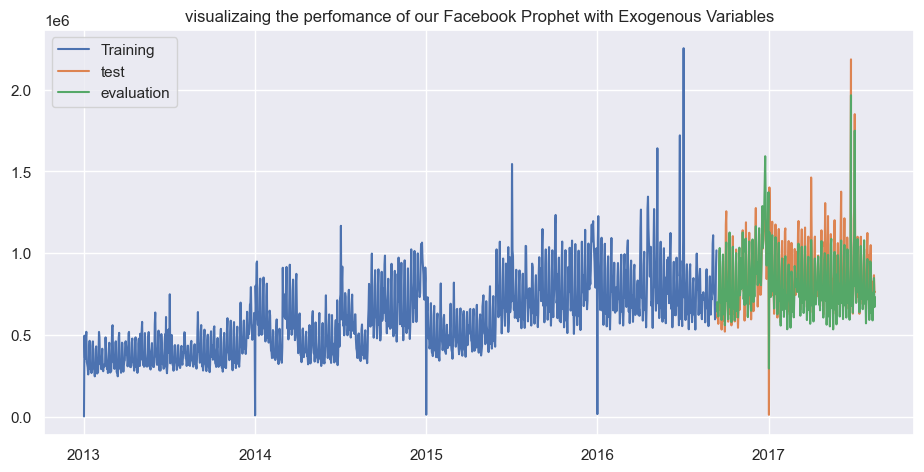

In [392]:
plt.plot(model_3_train_data, label= "Training")
plt.plot(model_3_test_data, label= "test")
plt.plot(model_3_eval_data, label= "evaluation")
plt.legend()
plt.title("visualizaing the perfomance of our Facebook Prophet with Exogenous Variables")

#### Calculating the Errors for Facebook Prophet with Exogenous Variables 

In [393]:

MEA_error_3= (MAE(model_3_test_data, model_3_eval_data)/model_3_test_data.mean())* 100

RMSLE_error_3= np.sqrt(MSLE(model_3_test_data, model_3_eval_data))


error_3= pd.DataFrame([["Facebook Prophet with exo", MEA_error_3, RMSLE_error_3]], columns= ["Model", "MAE", "RMSLE"])
               
error_3

,Model,MAE,RMSLE
0,Facebook Prophet with exo,y 8.486019 dtype: float64,0.202512


### 3.2.5(b) Multivariate modelling with Sarimax

In [238]:
multi_test

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
0,2016-09-12,0,1,0,3.0,1,6.787765e+05,5902.0,2545125.0
1,2016-09-13,0,1,0,3.0,1,6.034279e+05,7836.0,2443056.0
2,2016-09-14,0,1,0,3.0,1,6.242621e+05,13238.0,2412168.0
3,2016-09-15,0,1,0,3.0,1,5.683248e+05,8373.0,2466453.0
4,2016-09-16,0,1,0,3.0,1,6.919126e+05,14453.0,2666037.0
5,2016-09-17,0,1,0,3.0,1,8.992193e+05,9645.0,3111834.0
6,2016-09-18,0,1,0,3.0,1,1.018663e+06,10453.0,3048375.0
7,2016-09-19,0,1,0,3.0,1,6.811593e+05,8924.0,2516415.0
8,2016-09-20,0,1,0,3.0,1,6.509803e+05,10992.0,2526876.0
9,2016-09-21,0,1,0,3.0,1,6.669284e+05,16166.0,2516580.0


In [239]:
##making my date the index

sari_multi_test= multi_test.set_index("date")

In [240]:
sari_multi_train= multi_train.set_index("date")

#### getting my exogenous and endogenous features

In [241]:
train_endog=  sari_multi_train[["sales"]]
test_endog=  sari_multi_test[["sales"]]

train_exog= sari_multi_train.drop("sales", axis= 1)
test_exog=  sari_multi_test.drop("sales", axis= 1)

In [242]:


# Create the SARIMAX model
model_4 = SARIMAX(endog=train_endog, exog=train_exog, order=(7, 1, 6), seasonal_order=(0, 0, 0, 12), frequency="D").fit()

In [243]:
test_exog

,holiday_0,holiday_1,holiday_2,locale,transferred,onpromotion,transactions
date,,,,,,,
2016-09-12,0,1,0,3.0,1,5902.0,2545125.0
2016-09-13,0,1,0,3.0,1,7836.0,2443056.0
2016-09-14,0,1,0,3.0,1,13238.0,2412168.0
2016-09-15,0,1,0,3.0,1,8373.0,2466453.0
2016-09-16,0,1,0,3.0,1,14453.0,2666037.0
2016-09-17,0,1,0,3.0,1,9645.0,3111834.0
2016-09-18,0,1,0,3.0,1,10453.0,3048375.0
2016-09-19,0,1,0,3.0,1,8924.0,2516415.0
2016-09-20,0,1,0,3.0,1,10992.0,2526876.0


In [244]:
eval_4= model_4.forecast(steps= len(test_exog), exog=test_exog)

In [245]:
eval_4= pd.DataFrame(eval_4)

In [246]:
eval_4.columns= ["sales"]

In [247]:
eval_4.index= test_exog.index

### Evaluating The Perfomance of Our  ARIMAX Model

In [248]:

MEA_error_4= (MAE(test_endog, eval_4)/test_endog.mean())* 100

RMSLE_error_4= np.sqrt(MSLE(test_endog, eval_4))


error_4= pd.DataFrame([["ARIMAX", MEA_error_4, RMSLE_error_4]], columns= ["Model", "MAE", "RMSLE"])
               
error_4

,Model,MAE,RMSLE
0,ARIMAX,sales 9.507085 dtype: float64,0.187513


### visualizing the Performance of ArimaX model

In [249]:
eval_4

,sales
date,
2016-09-12,7.305987e+05
2016-09-13,6.248760e+05
2016-09-14,6.396297e+05
2016-09-15,5.873309e+05
2016-09-16,6.660997e+05
2016-09-17,8.899795e+05
2016-09-18,9.626044e+05
2016-09-19,7.357423e+05
2016-09-20,6.570299e+05


In [250]:
train_endog

,sales
date,
2013-01-01,2.511619e+03
2013-01-02,4.960924e+05
2013-01-03,3.614612e+05
2013-01-04,3.544597e+05
2013-01-05,4.773501e+05
...,...
2016-09-07,7.385439e+05
2016-09-08,5.958493e+05
2016-09-09,6.589690e+05


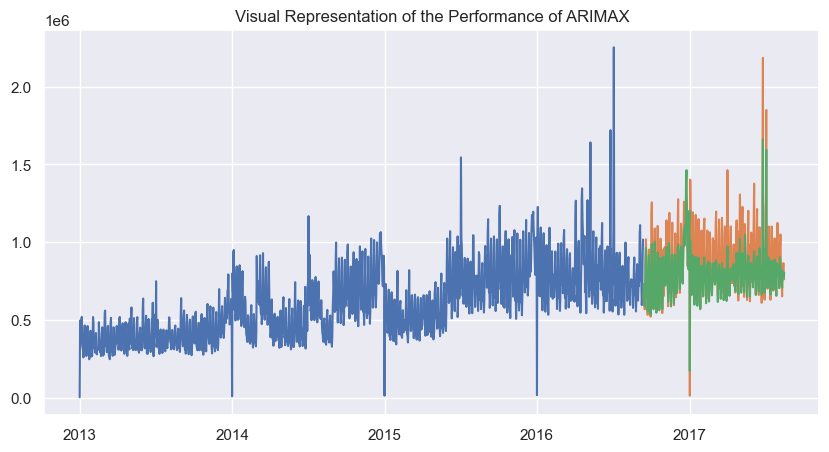

In [251]:
plt.plot(train_endog, label= "train")
plt.plot(test_endog, label= "test")
plt.plot(eval_4, label= "evaluation")
plt.title("Visual Representation of the Performance of ARIMAX")
plt.show()


### Forecast of ARIMAX

### 3.2.5(c) Multivariate Modelling with Machine Learning Models

In this section, we will take a look at two models:


- Decision Tree
- Random Forest

In [252]:
##loading our dataframes again 

multi_test

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
0,2016-09-12,0,1,0,3.0,1,6.787765e+05,5902.0,2545125.0
1,2016-09-13,0,1,0,3.0,1,6.034279e+05,7836.0,2443056.0
2,2016-09-14,0,1,0,3.0,1,6.242621e+05,13238.0,2412168.0
3,2016-09-15,0,1,0,3.0,1,5.683248e+05,8373.0,2466453.0
4,2016-09-16,0,1,0,3.0,1,6.919126e+05,14453.0,2666037.0
5,2016-09-17,0,1,0,3.0,1,8.992193e+05,9645.0,3111834.0
6,2016-09-18,0,1,0,3.0,1,1.018663e+06,10453.0,3048375.0
7,2016-09-19,0,1,0,3.0,1,6.811593e+05,8924.0,2516415.0
8,2016-09-20,0,1,0,3.0,1,6.509803e+05,10992.0,2526876.0
9,2016-09-21,0,1,0,3.0,1,6.669284e+05,16166.0,2516580.0


In [253]:
multi_train

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
0,2013-01-01,0,0,1,0.0,0,2.511619e+03,0.0,25410.0
1,2013-01-02,0,1,0,3.0,0,4.960924e+05,0.0,3076095.0
2,2013-01-03,0,1,0,3.0,0,3.614612e+05,0.0,2590632.0
3,2013-01-04,0,1,0,3.0,0,3.544597e+05,0.0,2590302.0
4,2013-01-05,0,1,1,0.0,0,4.773501e+05,0.0,3087909.0
...,...,...,...,...,...,...,...,...,...
1357,2016-09-07,0,1,0,3.0,0,7.385439e+05,12437.0,2630727.0
1358,2016-09-08,0,1,0,3.0,0,5.958493e+05,5757.0,2483646.0
1359,2016-09-09,0,1,0,3.0,0,6.589690e+05,11435.0,2626932.0
1360,2016-09-10,0,1,0,3.0,0,9.159386e+05,6595.0,3105795.0


### feature engineering for ML Models

In [254]:
def MyFeatures(df, date):
    df_copy = df.copy()  # Create a copy of the input DataFrame
    df_copy['day'] = df_copy[date].dt.day
    df_copy['month'] = df_copy[date].dt.month
    df_copy['day_of_month'] = df_copy[date].dt.day
    df_copy['day_of_year'] = df_copy[date].dt.dayofyear
    df_copy['week_of_year'] = df_copy[date].dt.isocalendar().week.astype(int)
    df_copy['day_of_week'] = df_copy[date].dt.dayofweek
    df_copy['is_weekend'] = np.where(df_copy['day_of_week'] > 4, 1, 0)
    df_copy['is_month_start'] = df_copy[date].dt.is_month_start.astype(int)
    df_copy['is_month_end'] = df_copy[date].dt.is_month_end.astype(int)
    df_copy['quarter'] = df_copy[date].dt.quarter
    df_copy['is_quarter_start'] = df_copy[date].dt.is_quarter_start.astype(int)
    df_copy['is_quarter_end'] = df_copy[date].dt.is_quarter_end.astype(int)
    df_copy['is_year_start'] = df_copy[date].dt.is_year_start.astype(int)
    df_copy['is_year_end'] = df_copy[date].dt.is_year_end.astype(int)
    return df_copy

In [255]:
ml_multi_test= MyFeatures(multi_test, "date")
ml_multi_train= MyFeatures(multi_train, "date")

### i. Data Splitting

In [256]:
##We will have to drop the date before proceeding, and save it into the variable ML_train and Ml_test
    
ml_train= ml_multi_train.drop("date", axis= 1)
ml_test= ml_multi_test.drop("date", axis= 1)

In [257]:
##getting my features and target 

In [258]:
ml_train_X= ml_train.drop("sales", axis= 1)

ml_train_y=ml_train["sales"]

ml_test_X=ml_test.drop("sales", axis= 1)

ml_test_y=ml_test["sales"]

### ii.Modeling with Decision Tree

In [259]:
# setting the appropriate parameters to prevent overfitting
decision_tree = DecisionTreeRegressor(random_state=36, max_depth=5, min_samples_split=5, min_samples_leaf=5)

In [260]:
decision_tree.fit(ml_train_X, ml_train_y)

DecisionTreeRegressor(max_depth=5, min_samples_leaf=5, min_samples_split=5,
                      random_state=36)

In [261]:
ml_test_X

,holiday_0,holiday_1,holiday_2,locale,transferred,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,0,1,0,3.0,1,5902.0,2545125.0,12,9,12,256,37,0,0,0,0,3,0,0,0,0
1,0,1,0,3.0,1,7836.0,2443056.0,13,9,13,257,37,1,0,0,0,3,0,0,0,0
2,0,1,0,3.0,1,13238.0,2412168.0,14,9,14,258,37,2,0,0,0,3,0,0,0,0
3,0,1,0,3.0,1,8373.0,2466453.0,15,9,15,259,37,3,0,0,0,3,0,0,0,0
4,0,1,0,3.0,1,14453.0,2666037.0,16,9,16,260,37,4,0,0,0,3,0,0,0,0
5,0,1,0,3.0,1,9645.0,3111834.0,17,9,17,261,37,5,1,0,0,3,0,0,0,0
6,0,1,0,3.0,1,10453.0,3048375.0,18,9,18,262,37,6,1,0,0,3,0,0,0,0
7,0,1,0,3.0,1,8924.0,2516415.0,19,9,19,263,38,0,0,0,0,3,0,0,0,0
8,0,1,0,3.0,1,10992.0,2526876.0,20,9,20,264,38,1,0,0,0,3,0,0,0,0
9,0,1,0,3.0,1,16166.0,2516580.0,21,9,21,265,38,2,0,0,0,3,0,0,0,0


In [262]:
result_5=  decision_tree.predict(ml_test_X)

In [263]:
MEA_error_5= (MAE(ml_test_y, result_5)/ ml_test_y.mean())* 100

RMSLE_error_5= np.sqrt(MSLE(ml_test_y, result_5))


error_5= pd.DataFrame([["Decision Tree", MEA_error_5, RMSLE_error_5]], columns= ["Model", "MAE", "RMSLE"])
               
error_5

,Model,MAE,RMSLE
0,Decision Tree,9.026673,0.139575


#### Visualizing Our Decision Tree's Performance

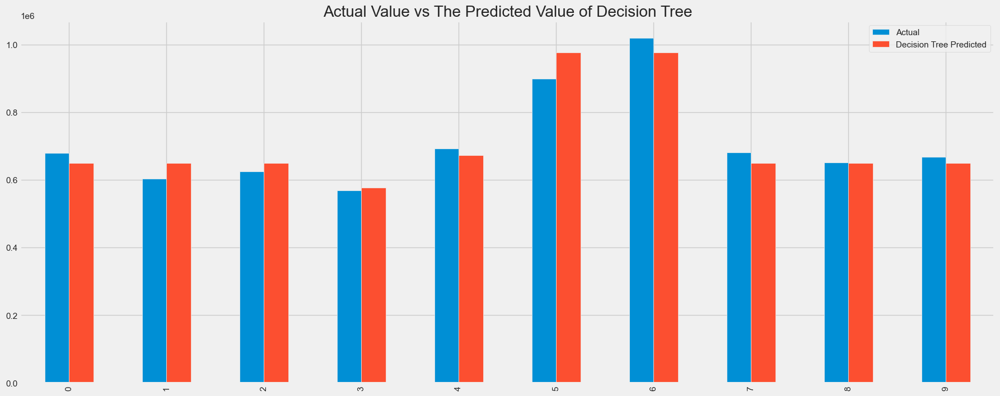

In [264]:
plt.style.use('fivethirtyeight')

##Converting the Y_test to an array

Y_test_2D= ml_test_y.values

Y_test_1D= np.array(ml_test_y).flatten()

##creating a dataframe for both predicted and actual values 

df=pd.DataFrame({'Actual':Y_test_1D, 'Decision Tree Predicted':result_5})

df1= df.head(10)
df1.plot(kind='bar', figsize=(20,8))
plt.title('Actual Value vs The Predicted Value of Decision Tree');

### ii. Random Forest

In [394]:
rf= RandomForestRegressor(n_estimators=30, max_depth= 5, random_state= 18, max_features= "sqrt").fit(ml_train_X, ml_train_y)



In [395]:
result_6= rf.predict(ml_test_X)

In [396]:
MEA_error_6= (MAE(ml_test_y, result_6)/ ml_test_y.mean())* 100

RMSLE_error_6= np.sqrt(MSLE(ml_test_y, result_6))


error_6= pd.DataFrame([["Random Forest", MEA_error_6, RMSLE_error_6]], columns= ["Model", "MAE", "RMSLE"])
               
error_6

,Model,MAE,RMSLE
0,Random Forest,17.572043,0.281783


#### Visualizing the performance of Random Forest

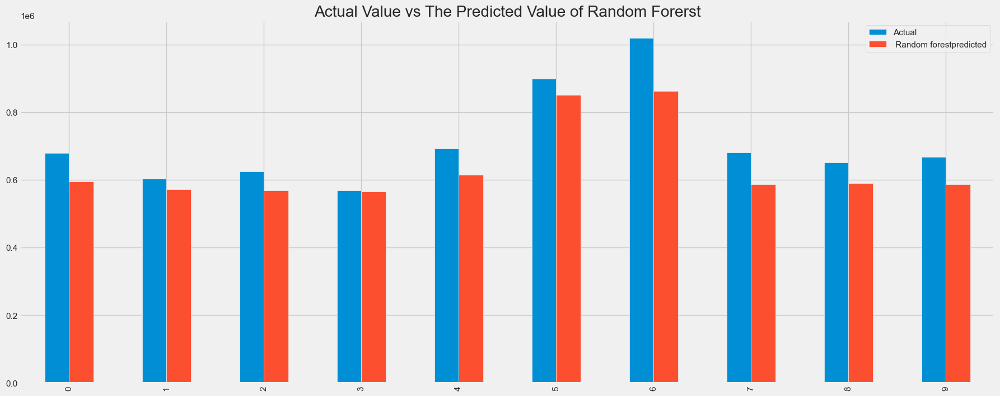

In [268]:
plt.style.use('fivethirtyeight')

df_2=pd.DataFrame({'Actual':Y_test_1D, ' Random forestpredicted':result_6})

df_3=df_2.head(10)

df_3.plot(kind='bar', figsize=(20,8))
plt.title('Actual Value vs The Predicted Value of Random Forerst');

### Results 

In [269]:
result= pd.concat([error_6, error_5, error_4, error_3, error_2, error_1])

In [270]:
result= result.reset_index()

In [271]:
result = result.sort_values(by= "RMSLE")

In [272]:
result

,index,Model,MAE,RMSLE
1,0,Decision Tree,9.026673,0.139575
2,0,ARIMAX,sales 9.507085 dtype: float64,0.187513
3,0,Facebook Prophet with exo,y 8.550494 dtype: float64,0.203059
0,0,Random Forest,16.408358,0.270404
4,0,Facebook Prophet,sales 10.511725 dtype: float64,0.277785
5,0,ARIMA,sales 18.007507 dtype: float64,0.316087


## Improving Model's Performance

- In this sectio, we are going to try and imporve the performance of the model using feature selection and feature importance
- We will also see how log-transfomation may help the performance of our SARIMA model

#### Feature Importance For Decision Tree

In [273]:
decision_tree.feature_importances_

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.49802423, 0.44755629, 0.        , 0.        , 0.01423219,
       0.02039886, 0.        , 0.01705175, 0.        , 0.        ,
       0.        , 0.00273669, 0.        , 0.        , 0.        ,
       0.        ])

In [274]:
dt_df= pd.DataFrame({"Feature_Name": ml_train_X.columns, "Feature_Importance":decision_tree.feature_importances_}).sort_values(
    by= "Feature_Importance", ascending= False)

In [275]:
dt_df

,Feature_Name,Feature_Importance
5,onpromotion,0.498024
6,transactions,0.447556
10,day_of_year,0.020399
12,day_of_week,0.017052
9,day_of_month,0.014232
16,quarter,0.002737
19,is_year_start,0.000000
18,is_quarter_end,0.000000
17,is_quarter_start,0.000000
15,is_month_end,0.000000


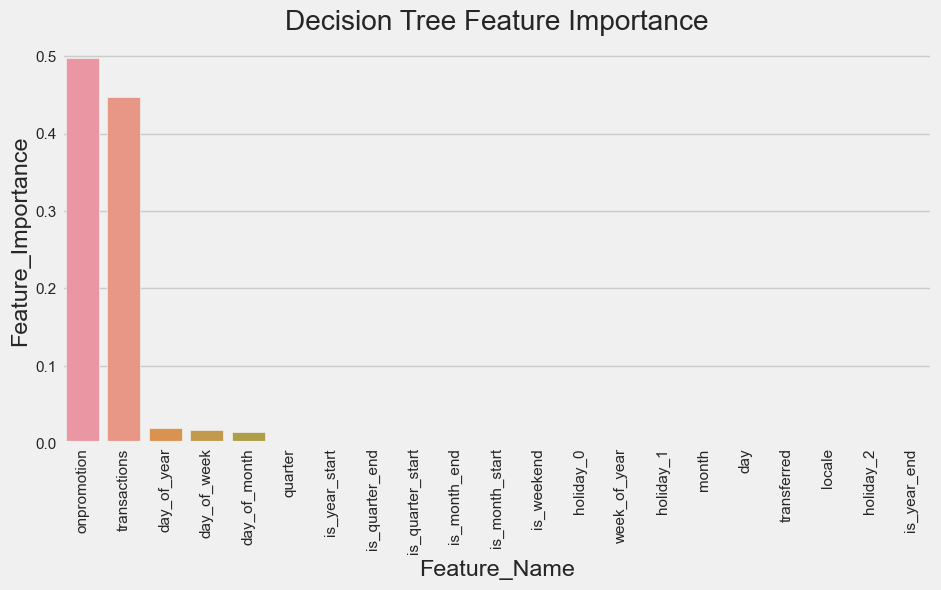

In [276]:
sns.barplot(data= dt_df, x= "Feature_Name", y= "Feature_Importance" )
plt.title("Decision Tree Feature Importance")
plt.xticks(rotation= 90)
plt.show()

from our grpah, we re going to drop columns with an importance of exponent -8 and lower:

- is_quarter_end
- transferred
- is_year_start
- is_year_end

In [277]:
##dropping our unwanted features

dt_X_train= ml_train_X.drop( ["is_quarter_end", "transferred", "is_year_start", "is_year_end"], axis= 1)

dt_X_test= ml_test_X.drop([ "is_quarter_end", "transferred", "is_year_start", "is_year_end"], axis= 1)

In [278]:
decision_tree.fit(dt_X_train, ml_train_y)

DecisionTreeRegressor(max_depth=5, min_samples_leaf=5, min_samples_split=5,
                      random_state=36)

In [279]:
result_7= decision_tree.predict(dt_X_test)

In [280]:
MEA_error_7= (MAE(ml_test_y, result_7)/ ml_test_y.mean())* 100

RMSLE_error_7= np.sqrt(MSLE(ml_test_y, result_7))


error_7= pd.DataFrame([["FS Decision Tree", MEA_error_7, RMSLE_error_7]], columns= ["Model", "MAE", "RMSLE"])
               
error_7

,Model,MAE,RMSLE
0,FS Decision Tree,9.026673,0.139575


In [281]:
error_5

,Model,MAE,RMSLE
0,Decision Tree,9.026673,0.139575


- There was only a slight improvement in our MAE so we will ignore

#### Feature Selection For Random Forest

In [282]:
rf.feature_importances_

array([1.35454440e-02, 7.54629553e-03, 4.20392433e-03, 1.13758828e-02,
       4.07906005e-05, 3.60871102e-01, 2.78488394e-01, 1.75449163e-02,
       2.22106968e-02, 1.70021087e-02, 4.06644386e-02, 2.62104521e-02,
       1.05772282e-01, 7.54010044e-02, 2.52580526e-03, 4.76978960e-04,
       7.86907666e-03, 1.72659926e-03, 2.49447371e-04, 6.12777292e-03,
       1.46586676e-04])

In [283]:
rf_df= pd.DataFrame({"Feature_Name": ml_train_X.columns, "Feature_Importance":rf.feature_importances_}).sort_values(
    by= "Feature_Importance", ascending= False)

In [284]:
rf_df

,Feature_Name,Feature_Importance
5,onpromotion,0.360871
6,transactions,0.278488
12,day_of_week,0.105772
13,is_weekend,0.075401
10,day_of_year,0.040664
11,week_of_year,0.026210
8,month,0.022211
7,day,0.017545
9,day_of_month,0.017002
0,holiday_0,0.013545


In [285]:
ex.bar(data_frame= rf_df, x= "Feature_Name", y= "Feature_Importance", title= "Random Forest Feature Importance")

We will be dropping:
    
    - is_quarter_start
    - is_month_end
    - is_quarter_end
    - is_year_end
    - transferred

In [286]:
###dropping our columns

rf_X_train= ml_train_X.drop(["is_quarter_start",
    "is_month_end",
    "is_quarter_end",
    "is_year_end",
    "transferred"], axis=1)

rf_X_test= ml_test_X.drop(["is_quarter_start",
    "is_month_end",
    "is_quarter_end",
    "is_year_end",
    "transferred"], axis=1)

In [287]:
rf.fit(rf_X_train, ml_train_y)

RandomForestRegressor(max_depth=5, max_features='sqrt', n_estimators=300,
                      random_state=18)

In [288]:
result_8= rf.predict(rf_X_test)

In [289]:
MEA_error_8= (MAE(ml_test_y, result_8)/ ml_test_y.mean())* 100

RMSLE_error_8= np.sqrt(MSLE(ml_test_y, result_8))


error_8= pd.DataFrame([["FS Random Forest", MEA_error_8, RMSLE_error_8]], columns= ["Model", "MAE", "RMSLE"])
               
error_8

,Model,MAE,RMSLE
0,FS Random Forest,13.500648,0.25211


### Final Result

In [290]:
final_result= pd.concat([error_8, error_7,error_6, error_5, error_4, error_3, error_2, error_1])
final_result = final_result.sort_values(by= "RMSLE")

In [291]:
final_result

,Model,MAE,RMSLE
0,FS Decision Tree,9.026673,0.139575
0,Decision Tree,9.026673,0.139575
0,ARIMAX,sales 9.507085 dtype: float64,0.187513
0,Facebook Prophet with exo,y 8.550494 dtype: float64,0.203059
0,FS Random Forest,13.500648,0.252110
0,Random Forest,16.408358,0.270404
0,Facebook Prophet,sales 10.511725 dtype: float64,0.277785
0,ARIMA,sales 18.007507 dtype: float64,0.316087


#### For my app:

- I will be using Facebook Prophet with exogenous variables as my predictor. 
- This is because with the Decision tree model, I had to drop the date column. 
- Also, with ARIMAX, since I couldn't use the 365 modelling, I will be 

### Modelling:

In [302]:
##we will be dropping our target from our test

fb_pro_test= fb_pro_test.drop("y", axis= 1)

In [303]:
##loading our dataframes again:

fb_pro_test


,ds,holiday,locale,transferred,onpromotion,transactions
0,2016-09-12,Not Holiday,Not Holiday,False,5902.0,2545125.0
1,2016-09-13,Not Holiday,Not Holiday,False,7836.0,2443056.0
2,2016-09-14,Not Holiday,Not Holiday,False,13238.0,2412168.0
3,2016-09-15,Not Holiday,Not Holiday,False,8373.0,2466453.0
4,2016-09-16,Not Holiday,Not Holiday,False,14453.0,2666037.0
5,2016-09-17,Not Holiday,Not Holiday,False,9645.0,3111834.0
6,2016-09-18,Not Holiday,Not Holiday,False,10453.0,3048375.0
7,2016-09-19,Not Holiday,Not Holiday,False,8924.0,2516415.0
8,2016-09-20,Not Holiday,Not Holiday,False,10992.0,2526876.0
9,2016-09-21,Not Holiday,Not Holiday,False,16166.0,2516580.0


In [304]:
fb_pro_train

,ds,holiday,locale,transferred,y,onpromotion,transactions
0,2013-01-01,Holiday,National,False,2.511619e+03,0.0,25410.0
1,2013-01-02,Not Holiday,Not Holiday,False,4.960924e+05,0.0,3076095.0
2,2013-01-03,Not Holiday,Not Holiday,False,3.614612e+05,0.0,2590632.0
3,2013-01-04,Not Holiday,Not Holiday,False,3.544597e+05,0.0,2590302.0
4,2013-01-05,Work Day,National,False,4.773501e+05,0.0,3087909.0
...,...,...,...,...,...,...,...
1357,2016-09-07,Not Holiday,Not Holiday,False,7.385439e+05,12437.0,2630727.0
1358,2016-09-08,Not Holiday,Not Holiday,False,5.958493e+05,5757.0,2483646.0
1359,2016-09-09,Not Holiday,Not Holiday,False,6.589690e+05,11435.0,2626932.0
1360,2016-09-10,Not Holiday,Not Holiday,False,9.159386e+05,6595.0,3105795.0


In [305]:
fb_pro_train.columns

Index(['ds', 'holiday', 'locale', 'transferred', 'y', 'onpromotion',
       'transactions'],
      dtype='object')

In [306]:
##saving my sample test dataframe:

fb_pro_test.to_csv("Desktop/python projects/Streamlit App/models/sample.csv")

In [307]:
##creating our feature variable for each feature we will be encoding:

label_feature= ["transferred"]

binary_feature= ["holiday"]

ordinal_feature= ["locale"]


In [308]:
rank= ["National", "Regional", "Local", "Not Holiday"]

In [309]:
fb_pro_train

,ds,holiday,locale,transferred,y,onpromotion,transactions
0,2013-01-01,Holiday,National,False,2.511619e+03,0.0,25410.0
1,2013-01-02,Not Holiday,Not Holiday,False,4.960924e+05,0.0,3076095.0
2,2013-01-03,Not Holiday,Not Holiday,False,3.614612e+05,0.0,2590632.0
3,2013-01-04,Not Holiday,Not Holiday,False,3.544597e+05,0.0,2590302.0
4,2013-01-05,Work Day,National,False,4.773501e+05,0.0,3087909.0
...,...,...,...,...,...,...,...
1357,2016-09-07,Not Holiday,Not Holiday,False,7.385439e+05,12437.0,2630727.0
1358,2016-09-08,Not Holiday,Not Holiday,False,5.958493e+05,5757.0,2483646.0
1359,2016-09-09,Not Holiday,Not Holiday,False,6.589690e+05,11435.0,2626932.0
1360,2016-09-10,Not Holiday,Not Holiday,False,9.159386e+05,6595.0,3105795.0


In [310]:
label_encoding_columns = ["transferred"]
binary_encoding_columns = ["holiday"]
ordinal_encoding_columns = ["locale"]

In [311]:
fb_pro_train.to_csv("Desktop/models/train.csv")

In [312]:
fb_pro_test.to_csv("Desktop/models/test.csv")

## Saving All Our Dependencies 

In [314]:
###saving my label encoder



joblib.dump(LE,"Desktop/models/LE.plk" )

['Desktop/models/LE.plk']

In [315]:
###saving my binary encoder

joblib.dump(BE,"Desktop/models/BE.plk" )

['Desktop/models/BE.plk']

In [316]:
###saving my ordinal encoder

joblib.dump(OE,"Desktop/models/OE.plk" )

['Desktop/models/OE.plk']

In [317]:
joblib.dump(model_3, "Desktop/models/FBP.joblib")

['Desktop/models/FBP.joblib']